# Семинар №3

In [1]:
import numpy as np
import cv2 
import skimage.exposure
import skimage.io
import matplotlib.pyplot as plt

%matplotlib inline

In [2]:
# вспомогательная функция
def plot_transform_result(src_image, transform_image, is_gray=False):
    """
    Отрисовать с помощью plt исходное изображение и его преобразование.
    
    :param src_image: np.ndarray: исходное изображение
    :param transform_image: np.ndarray: преобразованное изображение
    :param is_gray: bool: флаг для отображения ЧБ изображений
    :return: None
    """
    fig, m_axs = plt.subplots(1, 2, figsize=(6.4*2, 4.8*2), constrained_layout=False)
    ax1, ax2 = m_axs

    cmap = 'gray' if is_gray else None
    ax1.set_title('Исходное изображение')
    ax1.imshow(src_image, cmap=cmap)
    ax1.set_xticks([]), ax1.set_yticks([])
    ax2.set_title('Результат преобразования')
    ax2.imshow(transform_image, cmap=cmap)
    ax2.set_xticks([]), ax2.set_yticks([])
    plt.show()

# Гистограммы 

Так что такое гистограмма? Вы можете рассматривать гистограмму как график, который дает вам общее представление о распределении интенсивности изображения. Это график со значениями пикселей (от $0$ до $255$, не всегда) по оси $X$ и соответствующим количеством пикселей в изображении по оси $Y$.

Это просто еще один способ понять образ. Глядя на гистограмму изображения, вы получаете представление о контрасте, яркости, распределении интенсивности и т.д. этого изображения. Почти все инструменты обработки изображений сегодня предоставляют функции на гистограмме.

<img src="https://i.ibb.co/cJxrWhx/histogram_sample.jpg" alt="Drawing" style="width: 400px;"/>

Вы можете увидеть изображение и его гистограмму. (Помните, эта гистограмма нарисована для изображения в оттенках серого, а не для цветного изображения). Левая область гистограммы показывает количество более темных пикселей на изображении, а правая область показывает количество более ярких пикселей. На гистограмме видно, что темная область больше, чем яркая, а количество полутонов (значения пикселей в среднем диапазоне, скажем, около $127$) много меньше.

**Гистограммы** $-$ это собранные данные, организованные в набор предопределенных столбцов.
Когда мы говорим данные, мы не ограничиваем их значениями интенсивности (как мы видели в предыдущем уроке). Собранные данные могут быть любой функцией, которую вы найдете полезной для описания вашего изображения.

Давайте посмотрим на пример. Представьте, что матрица содержит информацию об изображении (то есть интенсивность в диапазоне $0-255$):

<img src="img/Histogram_Calculation_Theory_Hist.jpg" alt="Drawing" style="width: 400px;"/>

Что произойдет, если мы захотим считать эти данные организованным способом? Так как мы знаем, что диапазон информационных значений для этого случая равен 256 значениям, мы можем сегментировать наш диапазон по частям (называемым ячейками), например:

$$
{\begin{array}{l}
[0, 255] = { [0, 15] \cup [16, 31] \cup ....\cup [240,255] } \\
range = { bin_{1} \cup bin_{2} \cup ....\cup bin_{n = 15} }
\end{array}}
$$

и мы можем вести подсчет количества пикселей, попадающих в диапазон каждого $bin_{i}$. Применяя это к примеру выше, мы получаем изображение ниже (ось x представляет ячейки, а ось y – количество пикселей в каждом из них).

<img src="https://i.ibb.co/Wss2Fqh/Histogram_Calculation_Theory_Hist1.jpg" alt="Drawing" style="width: 400px;"/>

Это был простой пример того, как работает гистограмма и почему она полезна. Гистограмма может вести учет не только интенсивности цвета, но и любых характеристик изображения, которые мы хотим измерить (то есть градиенты, направления и т.д.).

Давайте выделим некоторые части гистограммы:

* __dims__: количество параметров, для которых вы хотите собрать данные. В нашем примере dims = $1$, потому что мы рассчитываем только значения интенсивности каждого пикселя (в полутоновом изображении)
* __bins__: это количество подразделений в каждом тусклом свете. В нашем примере bins = $16$
* __range__: пределы измеряемых значений. В этом случае: range = $[0,255]$

Что если вы хотите сосчитать две особенности? В этом случае ваша результирующая гистограмма будет трехмерным графиком (в котором $x$ и $y$ будут $bin_{x}$ и $bin_{y}$ для каждого объекта, а $z$ будет количеством отсчетов для каждой комбинации $(bin_ {x}, bin_ {y})$. То же самое относится и к дополнительным функциям (конечно, это становится сложнее).

## Гистограммы в OpenCV

Воспользуемся функцией ```cv2.calcHist()```, чтобы найти гистограмму. Давайте ознакомимся с функцией и ее параметрами:

```cv2.calcHist (image, channel, mask, histSize, range , hist, accumulate)```

* **images** $-$ это исходное изображение типа $uint8$ или $float32$. его следует указывать в квадратных скобках, т.е. **[img]**.
* **channel** $-$ также указывается в квадратных скобках. Это индекс канала, для которого мы рассчитываем гистограмму. Например, если входное изображение представляет собой изображение в градациях серого, его значение равно $[0]$. Для цветного изображения вы можете передать $[0]$, $[1]$ или $[2]$, чтобы вычислить гистограмму синего, зеленого или красного канала соответственно.
* **mask** $-$ маска изображения. Чтобы найти гистограмму полного изображения, она задается как **None**. Но если вы хотите найти гистограмму определенной области изображения, вы должны создать для нее изображение маски и указать ее как маску.
* **histSize** $-$ это представляет наш счетчик __bin__. Нужно указывать в квадратных скобках. Для полной шкалы мы передаем $[256]$.
* **range** $-$ это наш **range**. Обычно это $[0,256]$.
* **hist** $-$ выходная гистограмма, представляющая собой плотный или разреженный размерный массив.
* **accumulate** $-$ накопительный флаг. Если он установлен, гистограмма не очищается в начале при выделении. Эта функция позволяет вычислять одну гистограмму из нескольких наборов массивов или своевременно обновлять гистограмму.

Итак, начнем с примера изображения. Просто загрузите изображение в режиме оттенков серого и найдите его полную гистограмму.

(0.0, 256.0)

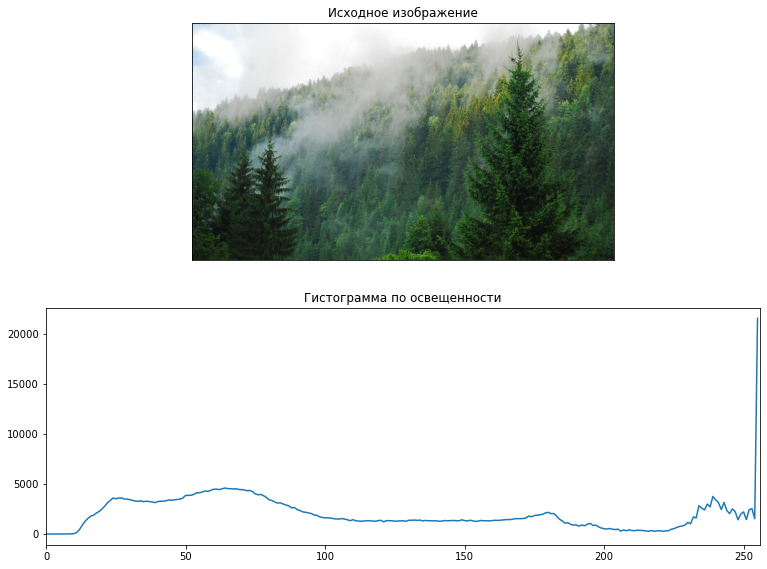

In [3]:
image = cv2.imread('img/forest.jpg')
h, w, _ = image.shape
image = cv2.resize(image.copy(), (w // 2, h // 2))
image = cv2.cvtColor(image.copy(), cv2.COLOR_BGR2RGB)

# grayscale
gray = cv2.cvtColor(image.copy(), cv2.COLOR_RGB2GRAY)

# получим гистограмму
# ravel() - разворачивает массив в список
hist = cv2.calcHist([gray.ravel()], [0], None, [256], [0, 256])

fig, m_axs = plt.subplots(2, 1, figsize=(6.4*2, 4.8*2), constrained_layout=False)
ax1, ax2 = m_axs

ax1.set_title('Исходное изображение')
ax1.imshow(image), ax1.set_xticks([]), ax1.set_yticks([])
ax2.set_title('Гистограмма по освещенности')
ax2.plot(hist)
ax2.set_xlim([0, 256])

## Гистограммы в  Numpy

```Numpy``` также предоставляет вам функцию ```np.histogram()```.

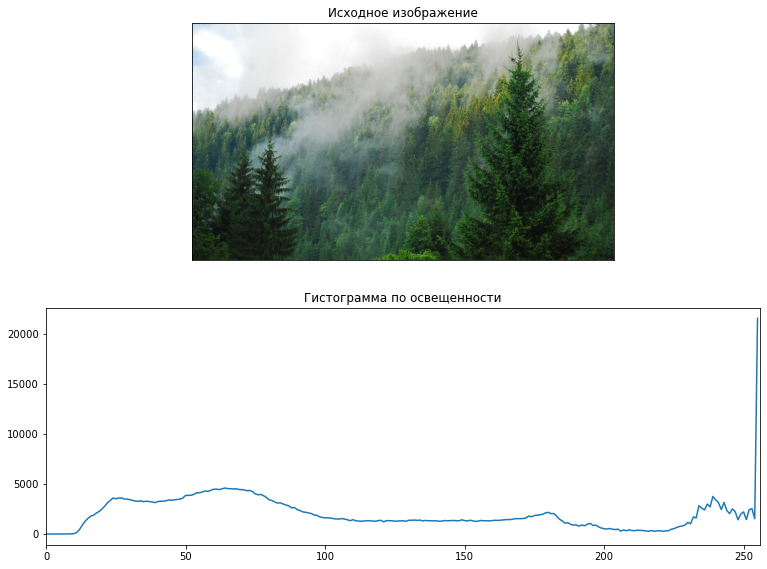

In [4]:
hist, bins = np.histogram(gray.ravel(), 256, [0,256])

fig, m_axs = plt.subplots(2, 1, figsize=(6.4*2, 4.8*2), constrained_layout=False)
ax1, ax2 = m_axs

ax1.set_title('Исходное изображение')
ax1.imshow(image), ax1.set_xticks([]), ax1.set_yticks([])
ax2.set_title('Гистограмма по освещенности')
ax2.plot(hist)
ax2.set_xlim([0,256]);

Гистограмма аналогичная, как мы рассчитывали ранее. Но ячейки будут иметь $257$ элементов, потому что **Numpy** рассчитывает ячейки как $0-0.99$, $1-1.99$, $2-2.99$ и т.д. Таким образом, конечный диапазон будет $255-255.99$. Чтобы представить это, они также добавляют $256$ в конце бинов. Но нам не нужно это $256$. До $255$ достаточно.

Визуализируем сразу $3$ канала цвета:

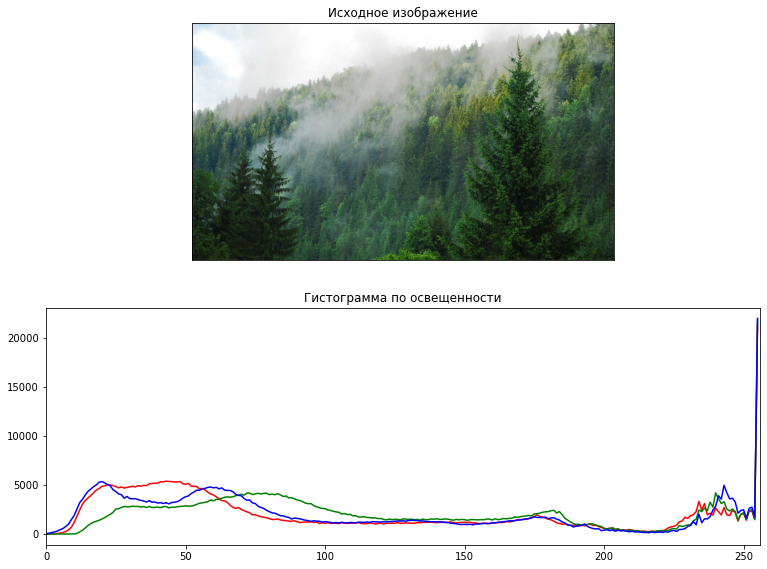

In [5]:
fig, m_axs = plt.subplots(2, 1, figsize=(6.4*2, 4.8*2), constrained_layout=False)
ax1, ax2 = m_axs

ax1.set_title('Исходное изображение')
ax1.imshow(image), ax1.set_xticks([]), ax1.set_yticks([])
ax2.set_title('Гистограмма по освещенности')
ax2.set_xlim([0,256])

color = ('r', 'g', 'b')
for i, col in enumerate(color):
    hist, bins = np.histogram(image[..., i].ravel(), 256, [0, 256])
    ax2.plot(hist, color=col)

## Применение маски

Мы использовали ```cv2.calcHist()```, чтобы найти гистограмму полного изображения. Что если вы хотите найти гистограммы некоторых областей изображения? Просто создайте изображение маски белым цветом на области, где вы хотите найти гистограмму, и черным в противном случае. Затем передайте это как маску.

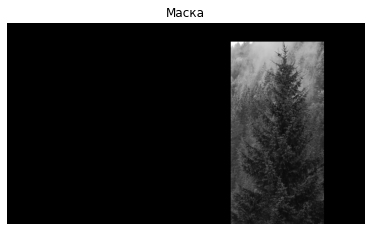

In [6]:
# grayscale
gray = cv2.cvtColor(image.copy(), cv2.COLOR_RGB2GRAY)

# создадим маску c помощью GUI ROI
# маска должна быть одномерной
mask = np.zeros(image.shape[:2], np.uint8)

mask[50:, 600:850] = 1

masked_img = cv2.bitwise_and(gray, gray, mask=mask)

## проверим, что мы вырезали то, что хотели
plt.figure(figsize=(6.4*1, 4.8*1), constrained_layout=False)
plt.title('Маска')
plt.imshow(masked_img, cmap='gray')
plt.axis('off')
plt.show()

Тут мы воспользовались распространенным приемом с *"маской"*, т.е. использовали массив из нулей, на которой наложили интересующую картнику. 

Для арифметических операция над матрицами в OpenCV есть несклько базовых функций. Рассмотрим несколько из них:

* __cv2.absdiff(src1, src2[,dst])__

    абсолютная разница между двумя массивами: $${\texttt{dst}(I)=|\texttt{src1}(I)-\texttt{src2}(I)|}$$

* __cv2.add(src1, src2[, dst[, mask[, dtype]]])__

    Функция add рассчитывае сумму двух массивов: $${\texttt{dst}(I)=\texttt{src1}(I)+\texttt{src2}(I) \quad\texttt{if mask}(I)\ne0}$$

* __cv2.bitwise_and(src1, src2[, dst[, mask]])__

    Функция рассчитывает побитовое логическое соединение для каждого элемента массива: $${\texttt{dst} (I)=\texttt{src1}(I)\wedge\texttt{src2}(I)\quad\texttt{if mask}(I)\ne0}$$

* __cv2.bitwise_not(src[, dst[, mask]])__

    Функция рассчитывает побитовую инверсию входного массива для каждого элемента: $${\texttt{dst}(I)=\neg{\texttt{src}(I)}}$$

* __cv2.bitwise_or(src1, src2[, dst[, mask]])__

    Функция вычисляет побитовую логическую дизъюнкцию для каждого элемента для: $${\texttt{dst}(I)=\texttt{src1}(I)\vee\texttt{src2}(I)\quad\texttt{if mask}(I)\ne0}$$

* __cv2.bitwise_xor(src1, src2[, dst[, mask]])__

    Функция вычисляет побитовую логическую операцию «исключая или» для каждого элемента массива: $${\texttt{dst}(I)=\texttt{src1}(I)\oplus\texttt{src2}(I)\quad\texttt{if mask}(I)\ne0}$$

Остальные можно найти в [документации](https://docs.opencv.org/3.4.2/d2/de8/group__core__array.html)

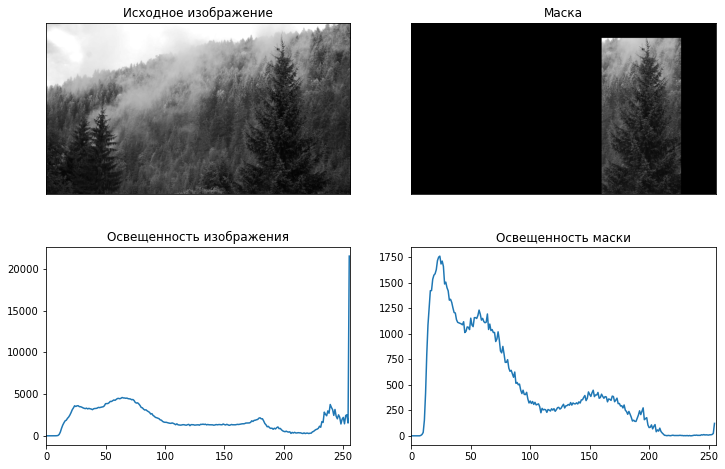

In [7]:
## посчитаем гистограмму для всего изображения и маски
hist_full = cv2.calcHist([gray], [0], None, [256], [0,256])
hist_mask = cv2.calcHist([gray], [0], mask, [256], [0,256])


fig, m_axs = plt.subplots(2, 2, figsize=(12,8))
ax1, ax2 = m_axs

ax1[0].set_title('Исходное изображение')
ax1[0].imshow(gray, cmap='gray'), ax1[0].set_xticks([]), ax1[0].set_yticks([])
ax1[1].set_title('Маска')
ax1[1].imshow(masked_img, cmap='gray'), ax1[1].set_xticks([]), ax1[1].set_yticks([])
ax2[0].set_title('Освещенность изображения')
ax2[0].plot(hist_full)
ax2[0].set_xlim(0, 256)
ax2[1].set_title('Освещенность маски')
ax2[1].plot(hist_mask)
ax2[1].set_xlim(0, 256);

Теперь посмотрим для всех каналов цвета интесивность на маске

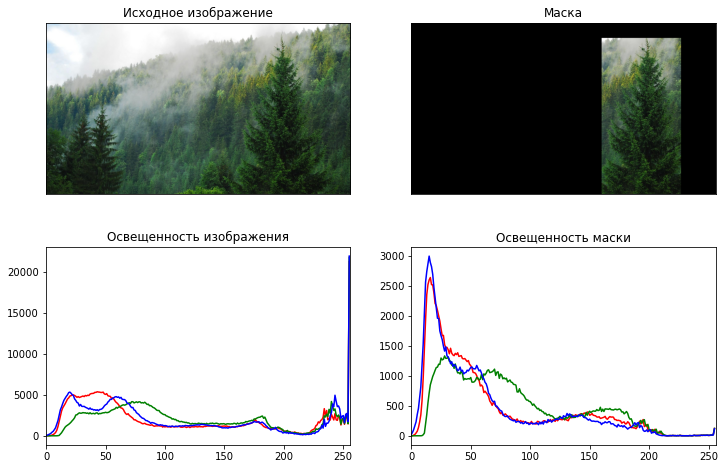

In [8]:
masked_img = cv2.bitwise_and(image, image, mask=mask)

fig, m_axs = plt.subplots(2, 2, figsize=(12,8))
ax1, ax2 = m_axs

ax1[0].set_title('Исходное изображение')
ax1[0].imshow(image, cmap='gray'), ax1[0].set_xticks([]), ax1[0].set_yticks([])
ax1[1].set_title('Маска')
ax1[1].imshow(masked_img, cmap='gray'), ax1[1].set_xticks([]), ax1[1].set_yticks([])
ax2[0].set_title('Освещенность изображения')
ax2[1].set_title('Освещенность маски')

color = ('r', 'g', 'b')
for i,col in enumerate(color):
    hist_full = cv2.calcHist([image], [i], None, [256], [0,256])
    hist_mask = cv2.calcHist([image], [i], mask, [256], [0,256])
    ax2[0].plot(hist_full, color=col)
    ax2[0].set_xlim(0, 256)
    ax2[1].plot(hist_mask, color=col)
    ax2[1].set_xlim(0, 256)

## Выравнивание гистограм

### Функция распределения

Прежде, чем переходить к алгоритмам выравнивания гистограмм, рассмотрим такую функцию, как __функция распределения__. 

Это понятие пошло из математической статистики. Обычно говорят функция распределения случайной величины. В каком-то смысле значения в каждом пикселе - случаыные величины, поэтому аналогия вполне уместна. Отличие будет в том, что наша функция будет нормирована на максимальное значение из всех случайных величин. В статистике функция распределения нормирована на 1 из-за того, что там говорят о вероятностях.

Согласно определению, дискретная функции распределения случайной величины выглядит следующим образом:


Если случайная величина $X$ дискретна, то есть её распределение однозначно задаётся функцией вероятности $\mathbb {P} (X=x_{i})=p_{i},\;i=1,2,\ldots$,
то функция распределения $F_{X}$ этой случайной величины кусочно-постоянна и может быть записана как:

$F_{X}(x)=\sum \limits _{i\colon x_{i}\leqslant x}p_{i}$.

_Рассмотрим следующий пример:_

| value | 1 | 2 | 3 |
| --- | --- | --- | --- |
| $x$ | -5 | 2.5 | 10 |
| $p$ | 0.5| 0.4 | 0.1 |

Чему, например, равно значение $F(-20)$? Это вероятность того, что выигрыш будет меньше, чем $–20$. И это невозможное событие: $F(-20)=P(x < -20)=0$. Совершенно понятно, что $F(x)=0$  и для всех $x$ из интервала $(-\infty, -5)$, а также для $x=-5$. Почему? По определению функции распределения:

$F(-5) = p(x < -5) = 0$ – вы согласны?  Функция $F(x)$ возвращает вероятность того, что в точке $x=-5$ вероятность будет СТРОГО МЕНЬШЕ «минус» пяти.

Таким образом: $F(x)=0$, если $x\le -5$.

На интервале $-5<x<2.5$ функция $F(x)=p(X<x)=0.5$, поскольку левее любой точки этого интервала есть только одно значение  $x_1 =-5$ случайной величины, которое появляется с вероятностью $0.5$. Кроме того, сюда же следует отнести точку $x=2.5$, так как:

F(2.5)=p(x<2.5)=0.5 – очень хорошо осознайте этот момент!

Таким образом, если $-5<x\le 2.5$ , то $F(x)=0.5$

Далее рассматриваем  промежуток $2.5<x\le 10$. СТРОГО ЛЕВЕЕ любой точки этого промежутка находятся две вероятности $x_1=-5$, $x_2=2.5$, поэтому:

$F(x)=p(X<x)=0.5+0.4=0.9$

И, наконец, если $x>10$, то $F(x)=p(X<x)=0.5+0.4+0.1=1$, ибо все значения $x_1=-5$, $x_2=2.5$, $x_3=10$ случайной величины $X$ лежат строго левее любой точки $x\in(10, \infty)$

Заметим, __важную вещь__: коль скоро, функция $F(x)$ характеризуем вероятность, то она может принимать значения лишь из промежутка $0 \le F(x) \le 1$ – и никакие другие!

Итак, функция распределения вероятностей является кусочной и, как многие знают, в таких случаях принято использовать фигурные скобки:

${F(x)=\begin{cases} 0, если\ x\le -5 \\ 0.5, если \ -5 < x \le 2.5 \\ 0.9, если \ 2.5 < x \le 10 \\ 1, если \ x > 10 \end{cases}}$

График данной функции имеет разрывный «ступенчатый» вид:

<img src="img/funkcia_raspredeleniya_dsv.jpg" alt="Drawing" style="width: 400px;"/>

### Вернемся к гистограммам

Рассмотрим изображение, значения пикселей которого ограничены только определенным диапазоном значений. Например, более яркое изображение будет иметь все пиксели, ограниченные высокими значениями. Но хорошее изображение будет иметь пиксели из всех областей изображения. Таким образом, вам нужно растянуть эту гистограмму до конца (как показано на изображении ниже), и это то, что делает выравнивание гистограммы (если коротко). Это обычно улучшает контраст изображения.

<img src="https://i.ibb.co/rZ3sM6q/histogram_equalization.png" alt="Drawing" style="width: 400px;"/>

Я бы порекомендовал вам прочитать страницу Википедии по выравниванию гистограммы для более подробной информации. Он имеет очень хорошее объяснение с отработанными примерами, так что вы сможете понять почти все после прочтения этого. Вместо этого здесь мы увидим его реализацию Numpy. После этого мы увидим функцию OpenCV.

Нам понадобится функция распределения значений (cumulative distribution function) пикслей в градации серого: 

$${cdf(x)=h(0)+h(1)+\dots+h(x),}$$ где $h(x)$ $-$ функция гистограммы

Значение функции распределения показывает, какое количество пикселей имеют яркости из отрезка $[0,x]$.

### Расчитаем функцию распределения

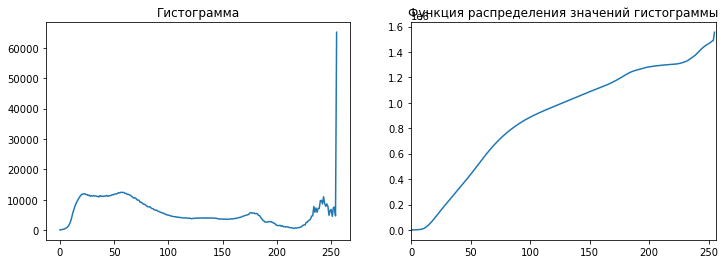

In [9]:
# гистограмма
hist, bins = np.histogram(image.flatten(), 256, [0,256])
# функция распределения
cdf = hist.cumsum()

fig, m_axs = plt.subplots(1, 2, figsize=(12, 4))
ax1, ax2 = m_axs

ax1.set_title('Гистограмма')
ax1.plot(hist)
ax2.set_title('Функция распределения значений гистограммы')
ax2.plot(cdf)
ax2.set_xlim(0, 256)
plt.show()

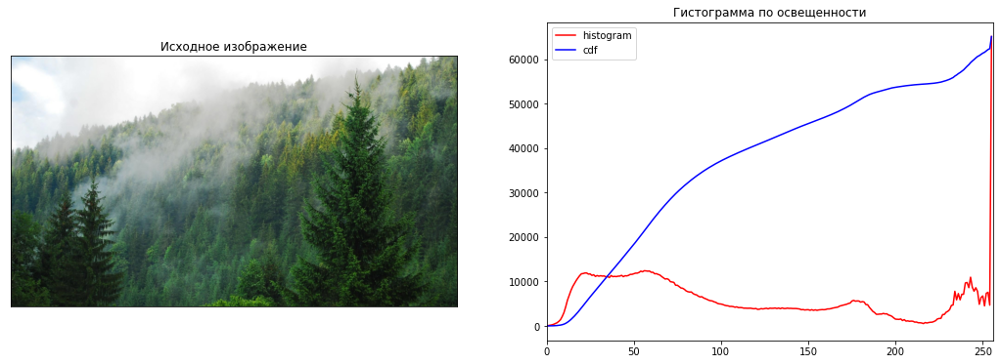

In [10]:
hist, bins = np.histogram(image.flatten(), 256, [0,256])

# фунция распределения
cdf = hist.cumsum()
cdf_normalized = cdf * hist.max() / cdf.max()

fig, m_axs = plt.subplots(1, 2, figsize=(18, 6))
ax1, ax2 = m_axs

ax1.set_title('Исходное изображение')
ax1.imshow(image), ax1.set_xticks([]), ax1.set_yticks([])
ax2.set_title('Гистограмма по освещенности')
ax2.plot(hist, color='r')
ax2.plot(cdf_normalized, color='b')
ax2.legend(('histogram', 'cdf'), loc = 'upper left')
ax2.set_xlim(0, 256)
plt.show()

Вы можете видеть гистограмму, лежащую в более ярком регионе. Нам нужен полный спектр. Для этого нам нужна функция преобразования, которая отображает входные пиксели в более яркой области для вывода пикселей в полной области. Это то, что делает выравнивание гистограммы.

Теперь мы находим минимальное значение гистограммы (исключая $0$) и применяем уравнение выравнивания гистограммы. Для маскированного массива все операции выполняются на немаскированных элементах. Вы можете прочитать больше об этом в документации Numpy на масках.

In [11]:
# еще раз глянем что же такое cdf
cdf

array([     47,     132,     289,     526,     877,    1402,    2108,
          3122,    4525,    6647,    9663,   13980,   19776,   26692,
         34669,   43531,   53083,   63303,   74097,   85417,   97154,
        108948,  120863,  132778,  144443,  156147,  167521,  179034,
        190179,  201520,  212712,  224014,  235226,  246476,  257541,
        268665,  279553,  290889,  301986,  313139,  324242,  335437,
        346651,  358038,  369124,  380419,  391678,  403059,  414663,
        426271,  438008,  449886,  461766,  473798,  486129,  498316,
        510736,  523124,  535445,  547799,  559868,  571941,  583673,
        595437,  607021,  618471,  629584,  640405,  650953,  661577,
        672021,  681973,  691860,  701650,  710793,  719945,  728785,
        737332,  745804,  754039,  761922,  769624,  777248,  784888,
        792168,  799241,  806225,  812911,  819431,  826006,  832307,
        838442,  844412,  850184,  855851,  861471,  866891,  872203,
        877264,  882

In [12]:
cdf_m = np.ma.masked_equal(cdf.copy(), 0)

# выравнивание к линейному распределению (min/max)
cdf_m = (cdf_m - cdf_m.min()) * 255 / (cdf_m.max() - cdf_m.min())

cdf = np.ma.filled(cdf_m, 0).astype('uint8')

In [13]:
# применим расчитанное распределение к исходному изображению
image2 = cdf[image.copy()]  

In [14]:
# разберем, что тут вообще произошло

image[:3, :3], cdf[image[:3, :3]]

(array([[[192, 219, 240],
         [192, 219, 240],
         [192, 219, 240]],
 
        [[196, 223, 244],
         [196, 223, 244],
         [196, 223, 244]],
 
        [[199, 224, 246],
         [199, 224, 246],
         [199, 224, 246]]], dtype=uint8),
 array([[[207, 213, 227],
         [207, 213, 227],
         [207, 213, 227]],
 
        [[209, 214, 233],
         [209, 214, 233],
         [209, 214, 233]],
 
        [[210, 214, 236],
         [210, 214, 236],
         [210, 214, 236]]], dtype=uint8))

In [15]:
# почему уменно так?

cdf[192], cdf[244]

(207, 233)

Теперь у нас есть справочная таблица, которая дает нам информацию о том, что является значением выходного пикселя для каждого значения входного пикселя.

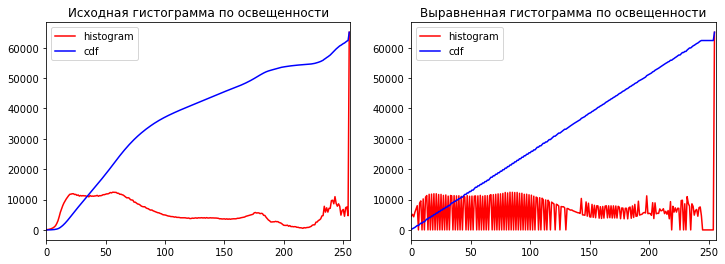

In [16]:
# снова считаем гистограмму и ее распределение
hist2, bins2 = np.histogram(image2.flatten(), 256, [0,256])
cdf2 = hist2.cumsum()
cdf_normalized2 = cdf2 * hist2.max() / cdf2.max()


fig, m_axs = plt.subplots(1, 2, figsize=(12, 4))
ax1, ax2 = m_axs

ax1.set_title('Исходная гистограмма по освещенности')
ax1.plot(hist, color='r')
ax1.plot(cdf_normalized, color='b')
ax1.legend(('histogram', 'cdf'), loc = 'upper left')
ax1.set_xlim(0, 256)

ax2.set_title('Выравненная гистограмма по освещенности')
ax2.plot(hist2, color='r')
ax2.plot(cdf_normalized2, color='b')
ax2.legend(('histogram', 'cdf'), loc = 'upper left')
ax2.set_xlim(0, 256);

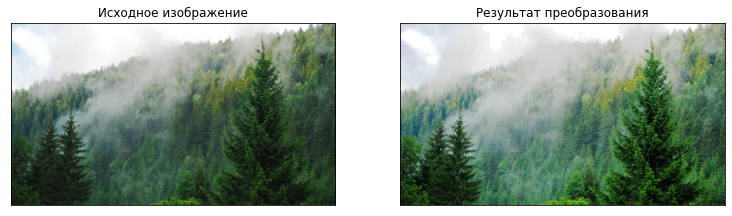

In [17]:
plot_transform_result(image, image2)

OpenCV имеет функцию для этого, ```cv2.equalizeHist()```. Его вход $-$ это просто изображение в градациях серого, а вывод – изображение, выровненное по гистограмме. Однако, реализация в OpenCV рабоает зачастую медленне, чем ```Numpy```.

## Выравнивание гистограмм с помощью skimage

Этот пример улучшает изображение с низким контрастом, используя метод, называемый выравниванием гистограммы, который «распределяет наиболее частые значения интенсивности». Выровненное изображение имеет примерно линейную кумулятивную функцию распределения.

C:\Users\keleas\Anaconda3\envs\CV_course\lib\site-packages\skimage\exposure\exposure.py:181: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel.
  hist, bin_centers = histogram(image, nbins)


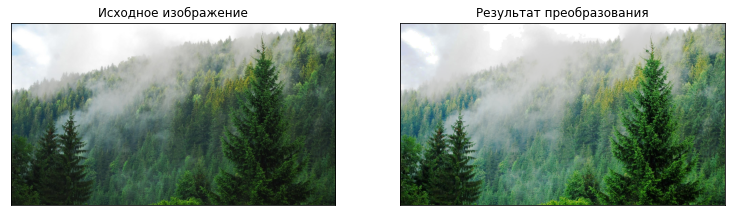

In [18]:
# Equalization
img_eq = skimage.exposure.equalize_hist(image)

plot_transform_result(image, img_eq)

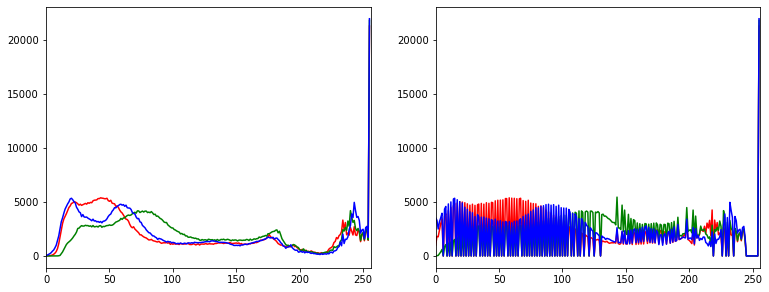

In [19]:
img_eq = np.array(img_eq * 255, dtype=np.uint8)

fig, m_axs = plt.subplots(1, 2, figsize=(6.4*2, 4.8*1), constrained_layout=False)
ax1, ax2 = m_axs
color = ('r', 'g', 'b')
for i,col in enumerate(color):
    hist_full = cv2.calcHist([image], [i], None, [256], [0,256])
    hist_mask = cv2.calcHist([img_eq], [i], None, [256], [0,256])
    ax1.plot(hist_full, color=col)
    ax1.set_xlim(0, 256)
    ax2.plot(hist_mask, color=col)
    ax2.set_xlim(0, 256)

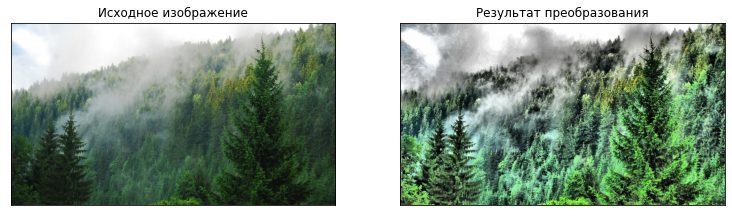

In [20]:
# Adaptive Equalization
img_adapteq = skimage.exposure.equalize_adapthist(image, clip_limit=0.03)

plot_transform_result(image, img_adapteq)

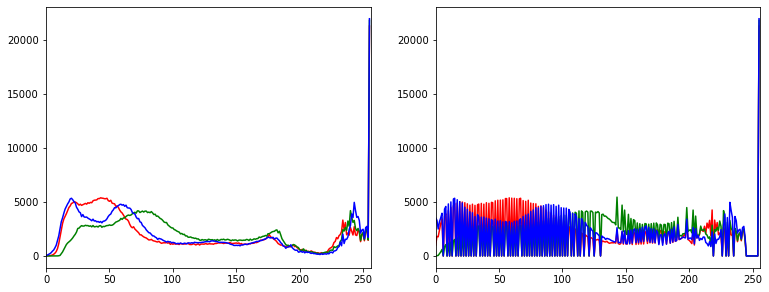

In [21]:
img_adapteq = np.array(img_adapteq * 255, dtype=np.uint8)

fig, m_axs = plt.subplots(1, 2, figsize=(6.4*2, 4.8*1), constrained_layout=False)
ax1, ax2 = m_axs
color = ('r', 'g', 'b')
for i,col in enumerate(color):
    hist_full = cv2.calcHist([image], [i], None, [256], [0,256])
    hist_mask = cv2.calcHist([img_eq], [i], None, [256], [0,256])
    ax1.plot(hist_full, color=col)
    ax1.set_xlim(0, 256)
    ax2.plot(hist_mask, color=col)
    ax2.set_xlim(0, 256)

## Сопоставление гистограмм

Этот пример демонстрирует функцию сопоставления гистограмм. Он манипулирует пикселями входного изображения, чтобы его гистограмма соответствовала гистограмме эталонного изображения. Если изображения имеют несколько каналов, сопоставление выполняется независимо для каждого канала, пока количество каналов равно во входном изображении и эталонном.

Сопоставление гистограммы можно использовать в качестве упрощенной нормализации для обработки изображений, например сопоставления признаков, особенно в обстоятельствах, когда изображения были взяты из разных источников или в разных условиях (например, при освещении).

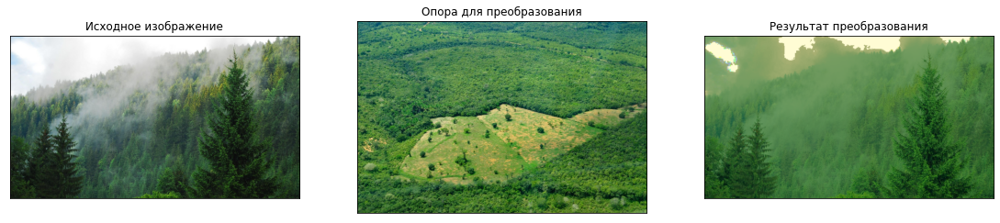

In [22]:
image = skimage.io.imread('img/forest.jpg')
reference = skimage.io.imread('img/forest_ex.jpg')

matched = skimage.exposure.match_histograms(image, reference, multichannel=True)

fig, m_axs = plt.subplots(1, 3, figsize=(6.4*3, 4.8*3), constrained_layout=False)
ax1, ax2, ax3 = m_axs

ax1.set_title('Исходное изображение')
ax1.imshow(image)
ax1.set_xticks([]), ax1.set_yticks([])

ax2.set_title('Опора для преобразования')
ax2.imshow(reference)
ax2.set_xticks([]), ax2.set_yticks([])

ax3.set_title('Результат преобразования')
ax3.imshow(matched)
ax3.set_xticks([]), ax3.set_yticks([])
plt.show()

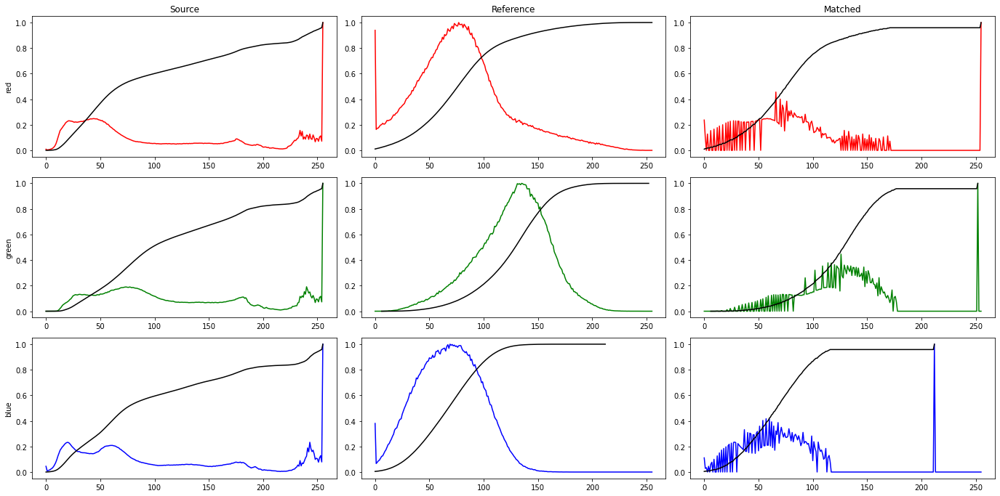

In [23]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(6.4*3, 4.8*2))

for i, img in enumerate((image, reference, matched)):
    for c, c_color in enumerate(('red', 'green', 'blue')):
        img_hist, bins = skimage.exposure.histogram(img[..., c], source_range='dtype')
        axes[c, i].plot(bins, img_hist / img_hist.max(), color=c_color)
        
        img_cdf, bins = skimage.exposure.cumulative_distribution(img[..., c])
        axes[c, i].plot(bins, img_cdf, color='black')
        axes[c, 0].set_ylabel(c_color)

axes[0, 0].set_title('Source')
axes[0, 1].set_title('Reference')
axes[0, 2].set_title('Matched')

plt.tight_layout()
plt.show()

## Сравнение гистограмм 

Чуть выше мы уже касались сравнения изображений с некими случайными процессами, точнее значения пикселей мы принимаем в качестве случайно величины. Проводя такую аналогию можно вводить принципы и методы статистического сравнения изображений между собой. Далее рассмотрим некоторые важные величины из математической стаистики, которые пригодятся дальше.

### Матемаматическое ожидание### 
 Мат ожидание означает среднее (взвешенное по вероятностям возможных значений) значение случайной величины.

В англоязычной литературе обозначается через ${\mathbb  {E}}[X]$, в русскоязычной — $M[X]$. В статистике часто используют обозначение $\mu$.

Для случайной величины, принимающей значения только $0$ или $1$ математическое ожидание равно $p$ — вероятности "единицы". Математическое ожидание суммы таких случайных величин равно $np$, где $n$ — количество таких случайных величин.

На практике математическое ожидание обычно оценивается как среднее арифметическое наблюдаемых значений случайной величины (выборочное среднее, среднее по выборке). Доказано, что при соблюдении определенных слабых условий (в частности, если выборка является случайной, то есть наблюдения являются независимыми) выборочное среднее стремится к истинному значению математического ожидания случайной величины при стремлении объема выборки (количества наблюдений, испытаний, измерений) к бесконечности.

_Определение для дискретной случайной величины._

Если $X$ — дискретная случайная величина, имеющая распределение ${\displaystyle \mathbb {P} (X=x_{i})=p_{i},\;\sum \limits _{i=1}^{\infty }p_{i}=1}$, то ${\displaystyle M[X]=\sum \limits _{i=1}^{\infty }x_{i}\,p_{i}}$.

__Свойства__

* Математическое ожидание числа (не случайной, фиксированной величины, константы) есть само число.

    ${\displaystyle M[a]=a}$, где ${\displaystyle a\in \mathbb {R} }$ — константа.
    
    
* Математическое ожидание линейно, то есть

    ${\displaystyle M[aX+bY]=aM[X]+bM[Y]}$,
    где ${\displaystyle X,Y}$ — случайные величины с конечным математическим ожиданием, а ${\displaystyle a,b\in \mathbb {R} }$ — произвольные константы.
   
   В частности, математическое ожидание суммы (разности) случайных величин равно сумме (соответственно - разности) их математических ожиданий.


* Математическое ожидание сохраняет неравенства, то есть если ${\displaystyle 0\leqslant X\leqslant Y}$ почти наверняка, и ${\displaystyle Y}$ — случайная величина с конечным математическим ожиданием, то математическое ожидание случайной величины ${\displaystyle X}$ также конечно, и более того

    ${\displaystyle 0\leqslant M[X]\leqslant M[Y]}$
    

* Математическое ожидание не зависит от поведения случайной величины на событии вероятности нуль, то есть если ${\displaystyle X=Y}$ почти наверняка, то

    ${\displaystyle M[X]=M[Y]}$.
    

* Математическое ожидание произведения двух независимых или некоррелированных случайных величин ${\displaystyle X,Y}$ равно произведению их математических ожиданий
    
    ${\displaystyle M[XY]=M[X]M[Y]}$.

### Дисперсия
Это мера разброса значений случайной величины относительно её математического ожидания. Обозначается $D[X]$ в русской литературе и $\operatorname {Var}(X)$ (англ. variance) в зарубежной. В статистике часто употребляется обозначение $\sigma _{X}^{2}$ или $\displaystyle \sigma ^{2}$.

Квадратный корень из дисперсии, равный $\displaystyle \sigma$, называется среднеквадратическим отклонением, стандартным отклонением или стандартным разбросом. Стандартное отклонение измеряется в тех же единицах, что и сама случайная величина, а дисперсия измеряется в квадратах этой единицы измерения.

Дисперсией случайной величины называют математическое ожидание квадрата отклонения случайной величины от её математического ожидания.

Пусть $X$ — случайная величина, определённая на некотором вероятностном пространстве. Тогда дисперсией называется ${\displaystyle D[X]=M\left[{\big (}X-M[X]{\big )}^{2}\right]}$

Если случайная величина ${\displaystyle X}$ дискретная, то

${\displaystyle D[X]=\sum _{i=1}^{n}{p_{i}(x_{i}-M[X])^{2}}}$

${\displaystyle D[X]={\frac {1}{2}}\sum _{i=1}^{n}\sum _{j=1}^{n}{p_{i}p_{j}(x_{i}-x_{j})^{2}}=\sum _{i=1}^{n}\sum _{j<i}{p_{i}p_{j}(x_{i}-x_{j})^{2}},}$

__Свойства__

* В силу линейности математического ожидания справедлива формула:

    ${\displaystyle D[X]=M[X^{2}]-\left(M[X]\right)^{2}}$.


* Дисперсия любой случайной величины неотрицательна: ${\displaystyle D[X]\geqslant 0}$.


* Если дисперсия случайной величины конечна, то конечно и её математическое ожидание.


* Если случайная величина равна константе, то её дисперсия равна нулю: ${\displaystyle D[a]=0}$. Верно и обратное: если ${\displaystyle D[X]=0}$, то ${\displaystyle X=M[X]}$ почти всюду.


* Дисперсия суммы двух случайных величин равна:
    ${\displaystyle D[X+Y]=D[X]+D[Y]+2\,{\text{cov}}(X,Y)}$, где ${\displaystyle {\text{cov}}(X,Y)}$ — их ковариация.


* Для дисперсии произвольной линейной комбинации нескольких случайных величин имеет место равенство:
    
    ${\displaystyle D\left[\sum _{i=1}^{n}c_{i}X_{i}\right]=\sum _{i=1}^{n}c_{i}^{2}D[X_{i}]+2\sum _{1\leqslant i<j\leqslant n}c_{i}c_{j}\,{\text{cov}}(X_{i},X_{j})}$, где ${\displaystyle c_{i}\in \mathbb {R} }$.


* В частности, ${\displaystyle D[X_{1}+\ldots +X_{n}]=D[X_{1}]+\ldots +D[X_{n}]}$ для любых независимых или некоррелированных случайных величин, так как их ковариации равны нулю.

* ${\displaystyle D\left[aX\right]=a^{2}D[X]}$.

* ${\displaystyle D\left[-X\right]=D[X]}$.

* ${\displaystyle D\left[X+b\right]=D[X]}$.

### Ковариация

Важной характеристикой совместного распределения двух случайных величин является **ковариация** (или корреляционный момент). Ковариация определяется как математическое ожидание произведения отклонений случайных величин:

${\displaystyle \mathrm {cov} _{XY}=\mathbf {M} \left[(X-\mathbf {M} (X))(Y-\mathbf {M} (Y))\right]=\mathbf {M} (XY)-\mathbf {M} (X)\mathbf {M} (Y)}$.

__Свойства__

* Ковариация двух независимых случайных величин ${\displaystyle \mathbf {X} }$  и ${\displaystyle \mathbf {Y} }$ равна нулю.


* Абсолютная величина ковариации двух случайных величин ${\displaystyle \mathbf {X} }$  и ${\displaystyle \mathbf {Y} }$  не превышает среднего геометрического их дисперсий: ${\displaystyle |\mathrm {cov} _{XY}|\leqslant {\sqrt {\mathrm {D} _{X}\mathrm {D} _{Y}}}}$.


* Ковариация имеет размерность, равную произведению размерности случайных величин, то есть величина ковариации зависит от единиц измерения независимых величин. Данная особенность ковариации затрудняет её использование в целях корреляционного анализа.


### Коэффицент корреляции

Корреляция, или корреляционная зависимость — статистическая взаимосвязь двух или более случайных величин (либо величин, которые можно с некоторой допустимой степенью точности считать таковыми).

Математической мерой корреляции двух случайных величин служит корреляционное отношение ${\displaystyle \mathbf {\eta }}$ либо коэффициент корреляции ${\displaystyle \mathbf {R} }$ (или ${\displaystyle \mathbf {r}}$ ). В случае если изменение одной случайной величины не ведёт к закономерному изменению другой случайной величины, но приводит к изменению другой статистической характеристики данной случайной величины, то подобная связь не считается корреляционной, хотя и является статистической.


__Линейный коэффициент корреляции__

Для устранения недостатка ковариации был введён линейный коэффициент корреляции (или коэффициент корреляции Пирсона). Коэффициент корреляции рассчитывается по формуле:

${\displaystyle \mathbf {r} _{XY}={\frac {\mathbf {cov} _{XY}}{\mathbf {\sigma } _{X}{\sigma }_{Y}}}={\frac {\sum (X-{\bar {X}})(Y-{\bar {Y}})}{\sqrt {\sum (X-{\bar {X}})^{2}\sum (Y-{\bar {Y}})^{2}}}}}$,

где ${\displaystyle {\overline {X}}={\frac {1}{n}}\sum _{t=1}^{n}X_{t}}$, ${\displaystyle {\overline {Y}}={\frac {1}{n}}\sum _{t=1}^{n}Y_{t}}$ — среднее значение выборок.

__Свойства__

* Коэффициент корреляции изменяется в пределах от минус единицы до плюс единицы.


* Неравенство Коши — Буняковского:
    если принять в качестве скалярного произведения двух случайных величин ковариацию ${\displaystyle \langle X,Y\rangle =\mathrm {cov} (X,Y)}$, то норма случайной величины будет равна ${\displaystyle \|X\|={\sqrt {\mathrm {D} [X]}}}$, и следствием неравенства Коши — Буняковского будет:
    
    ${\displaystyle -1\leqslant \mathbb {R} _{X,Y}\leqslant 1}$.


* Коэффициент корреляции равен ${\displaystyle \pm 1}$ тогда и только тогда, когда ${\displaystyle X}$ и ${\displaystyle Y}$ линейно зависимы (исключая события нулевой вероятности, когда несколько точек «выбиваются» из прямой, отражающей линейную зависимость случайных величин):

   ${\displaystyle \mathbb {R} _{X,Y}=\pm 1\Leftrightarrow Y=kX+b,k\neq 0}$,
    где ${\displaystyle k,b\in \mathbb {R} }$. Более того в этом случае знаки ${\displaystyle \mathbb {R} _{X,Y}}$ и ${\displaystyle k}$ совпадают:
    ${\displaystyle \operatorname {sgn} \mathbb {R} _{X,Y}=\operatorname {sgn} k}$.


* Если ${\displaystyle X,Y}$ независимые случайные величины, то ${\displaystyle \mathbb {R} _{X,Y}=0}$. Обратное в общем случае неверно.

__Объяснение на пальцах__ 

| Значение коэффициента | Какая корреляция? | О чем это говорит? |
| --- | --- | -- | 
| r=1 | Сильная положительная корреляция | Люди, которые едят чернику, обладают острым зрением. Ешьте чернику! |
| r<0,5 | Слабая положительная корреляция | Некоторые люди, которые любят чернику, обладают острым зрением. Но это не точно. Короче, ничего не понятно пока. Но лучше есть чернику на всякий случай. |
| r=0 | Корреляция отсутствует | Черника и зрение никак не связаны. |
| r<-0,5 | Слабая отрицательная корреляция | Бывают случаи ухудшения зрения из-за черники. Не стоит рисковать. |
| r=-1 | Сильная отрицательная корреляция | Практически все, кто ел чернику, ослепли. Берегитесь черники! | 

### Сравнение гистограмм

Безусловно, что пользы от гистограмм не будет никакой, если не сравнивать их с эталонными диаграммами. Предположим, есть эталонное изображение $-$ какой-то объект заданных размеров. Также есть множество неизвестных изображений, на которых нужно найти эталонное изображение. Для этого нужно перебирать участки изображений, сравнивая содержимое с эталоном. Можно сравнивать каждую точку из участка, но это будет медленно. Гораздо быстрее по ресурсам $-$ это сравнить гистограммы яркости. Для сравнения гистограмм в OpenCV предусмотрена функция ```cv2.CompareHist()```.

Мы рассмотрим только несколько метрик для сравнения: 

1. __Correlation__ (```method=cv2.HISTCMP_CORREL```)

$d(H_1,H_2) =  \frac{\sum_I (H_1(I) - \bar{H_1}) (H_2(I) - \bar{H_2})}{\sqrt{\sum_I(H_1(I) - \bar{H_1})^2 \sum_I(H_2(I) - \bar{H_2})^2}}$, где $\bar{H_k} =  \frac{1}{N} \sum _J H_k(J)$

2. __Chi-Square__ (```method=cv2.HISTCMP_CHISQR```)

$d(H_1,H_2) =  \sum _I  \frac{\left(H_1(I)-H_2(I)\right)^2}{H_1(I)}$

3. __Intersection__ (```method=cv2.HISTCMP_INTERSECT```)

$d(H_1,H_2) =  1 - \sum _I  \min (H_1(I), H_2(I))$

4. __Bhattacharyya distance__ (```method=cv2.HISTCMP_BHATTACHARYYA```).

$d(H_1,H_2) =  \sqrt{1 - \frac{1}{\sqrt{\bar{H_1} \bar{H_2} N^2}} \sum_I \sqrt{H_1(I) \cdot H_2(I)}}$

In [24]:
carpet = cv2.imread('img/carpet_ex.jpg')
carpet_gray = cv2.cvtColor(carpet, cv2.COLOR_BGR2GRAY)
forest = cv2.imread('img/forest_ex.jpg')
forest_gray = cv2.cvtColor(forest, cv2.COLOR_BGR2GRAY)

hist_carpet = cv2.calcHist([carpet_gray.ravel()], [0], None, [256], [0,256])
hist_forest = cv2.calcHist([forest_gray.ravel()], [0], None, [256], [0,256])

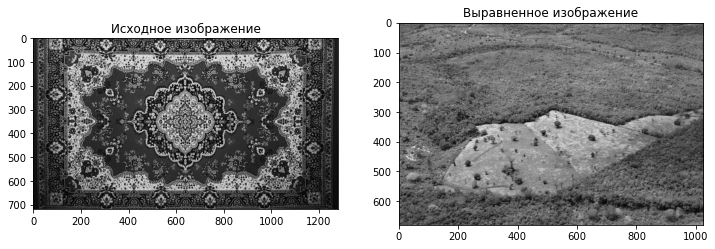

In [25]:
fig, m_axs = plt.subplots(1, 2, figsize=(12,8))
ax1, ax2 = m_axs
ax1.set_title('Исходное изображение')
ax1.imshow(carpet_gray, cmap='gray')
ax2.set_title('Выравненное изображение')
ax2.imshow(forest_gray, cmap='gray');

Correlation: -0.023
Intersection: 0.431
Bhattacharyya: 0.451


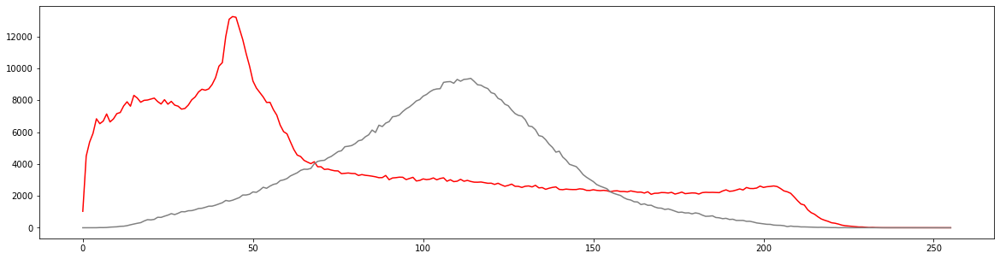

In [26]:
# возьмем выравненные гистограммы освещенности и сравним через корреляцию

cor_1 = cv2.compareHist(hist_carpet, hist_forest, cv2.HISTCMP_CORREL)

cor_2 = cv2.compareHist(hist_carpet, hist_forest, cv2.HISTCMP_INTERSECT) / np.sum(hist_carpet)

cor_3 = cv2.compareHist(hist_carpet, hist_forest, cv2.HISTCMP_BHATTACHARYYA)

fig, m_axs = plt.subplots(1, 1, figsize=(20, 5))
ax1 = m_axs

ax1.plot(hist_carpet, color='r')
ax1.plot(hist_forest, color='gray')

print(f'Correlation: {cor_1:.3f}\n'
      f'Intersection: {cor_2:.3f}\n'
      f'Bhattacharyya: {cor_3:.3f}')

###  Другой пример

Рассмотрим изображение более схожие друг к другу.

Correlation: 0.249
Intersection: 0.698
Bhattacharyya: 0.370


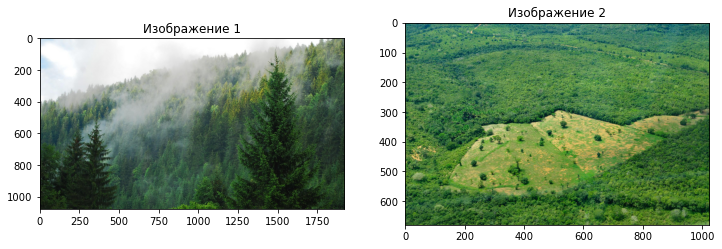

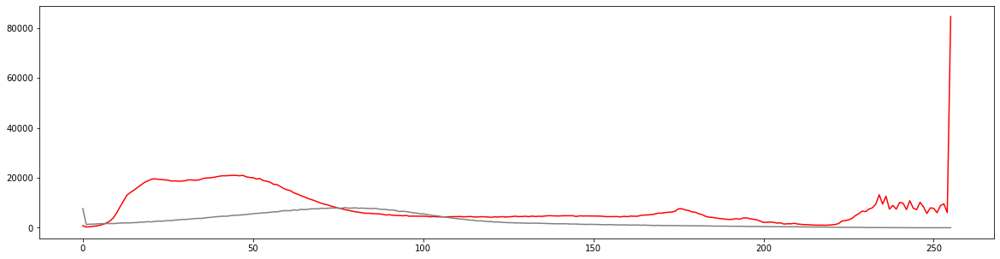

In [27]:
another_forest = cv2.imread('img/forest.jpg')
another_forest = cv2.cvtColor(another_forest, cv2.COLOR_BGR2RGB)
another_forest_gray = another_forest[:, :, 0]  # выделим один канал
forest = cv2.imread('img/forest_ex.jpg')
forest = cv2.cvtColor(forest, cv2.COLOR_BGR2RGB)
forest_gray = forest[:, :, 0]  # выделим один канал

hist_another_forest = cv2.calcHist([another_forest_gray.ravel()], [0], None, [256], [0,256])
hist_forest = cv2.calcHist([forest_gray.ravel()], [0], None, [256], [0,256])

fig, m_axs = plt.subplots(1, 2, figsize=(12,8))
ax1, ax2 = m_axs
ax1.set_title('Изображение 1')
ax1.imshow(another_forest)
ax2.set_title('Изображение 2')
ax2.imshow(forest);

# возьмем выравненные гистограммы освещенности и сравним через корреляцию

cor_1 = cv2.compareHist(hist_another_forest, hist_forest, cv2.HISTCMP_CORREL)

cor_2 = cv2.compareHist(hist_another_forest, hist_forest, cv2.HISTCMP_INTERSECT) / np.sum(hist_carpet)

cor_3 = cv2.compareHist(hist_another_forest, hist_forest, cv2.HISTCMP_BHATTACHARYYA)

fig, m_axs = plt.subplots(1, 1, figsize=(20, 5))
ax1 = m_axs

ax1.plot(hist_another_forest, color='r')
ax1.plot(hist_forest, color='gray')

print(f'Correlation: {cor_1:.3f}\n'
      f'Intersection: {cor_2:.3f}\n'
      f'Bhattacharyya: {cor_3:.3f}')

Заметьте, что в качестве примера были выбраны близкие гистограммы, по сути одна, но с разными операциями выравнивания. Вариативность применения коэффициента корреляции зависит от вашей фантазии и возможности интерпретировать результат.

**Помните**, что корреляция показывает только **линейную** зависимость двух случайных величин. Порой связь может быть гораздо сложнее.

**Вопрос:** корректно ли сравнивать гистограммы на рассмотренных выше изображениях?

### Практика

1. Выделите на изображении леса, которые мы использовали выше, дерево и небо.

2. Попробуйте разделить два объекта разного класса между собой с помощью сравнения гистограмм.

In [28]:
# Ваш код

Вообще говоря, сравнивать мы можем любые гистограммы. 

Разберём на примере самый простой случай классификации, когда пространство признака одномерное, а нам нужно разделить 2 класса. Ситуация встречается чаще, чем может представиться: например, когда нужно отличить два сигнала, или сравнить паттерн с образцом. Пусть у нас есть обучающая выборка. При этом получается изображение, где по оси X будет мера похожести, а по оси Y -количество событий с такой мерой. Когда искомый объект похож на себя — получается левая гауссиана. Когда не похож — правая. Значение X=0.4 разделяет выборки так, что ошибочное решение минимизирует вероятность принятия любого неправильного решения. Именно поиском такого разделителя и является задача классификации.

<img src="https://i.ibb.co/gdG3jGj/hist_comp.png" alt="Drawing" style="width: 500px;"/>

# Выравнивание цвета изображений 


Коррекция (Enhancement) предназначена для того, чтобы сделать изображение более подходящим, чем оригинал, для конкретного применения.
Метод гамма-коррекции полезен, когда необходимо изменить контрастность и яркость изображения.
Чтобы понять, что такое гамма-коррекция, сначала нужно разобраться в преобразовании Power Law Transformation. С входными изображениями f(x, y) и после преобразования T у нас есть увеличенное выходное изображение g(x, y):
                                                    $g(x, y) = T[ f(x, y) ]$

Если обозначить r, s как серый уровень f(x, y) и g(x, y) для любой точки (x, y), то формулу можно записать как:

<img src="img/Chart-5.jpg" alt="Drawing" style="width: 500px;"/>

## Контраст изоражений

Контраст изображения достигается за счет смещения верхних и нижних значений изображения, как показано на рисунке ниже.

<img src="img/Chart-2.jpg" alt="Drawing" style="width: 300px;"/>

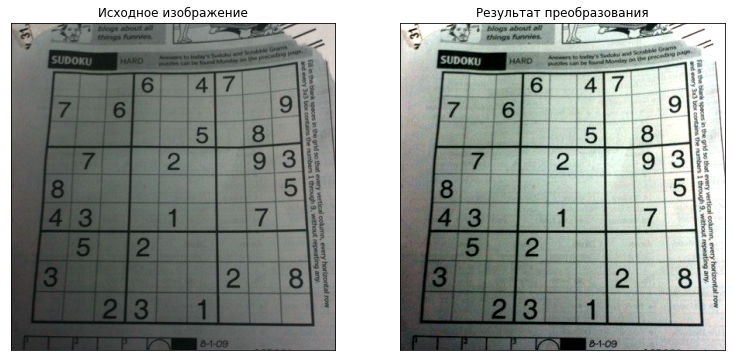

In [29]:
# Contrast stretching
image = cv2.imread('img/sudoku.jpg')

p2 = np.percentile(image, 2)
p98 = np.percentile(image, 95)
image_rescale = skimage.exposure.rescale_intensity(image, in_range=(p2, p98))

plot_transform_result(image, image_rescale)

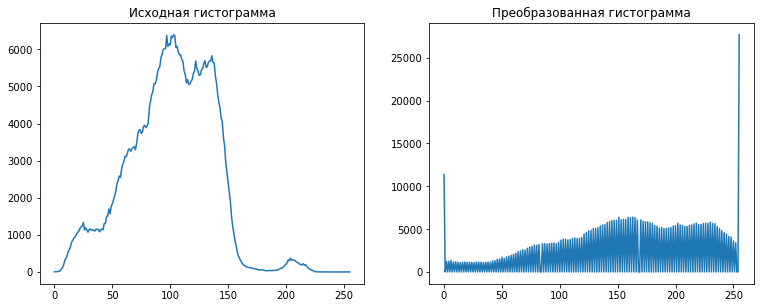

In [30]:
hist, bins = np.histogram(image.flatten(), 256, [0,256])

hist_rescale, bins = np.histogram(image_rescale.flatten(), 256, [0,256])

fig, m_axs = plt.subplots(1, 2, figsize=(6.4*2, 4.8*1), constrained_layout=False)
ax1, ax2 = m_axs

ax1.set_title('Исходная гистограмма')
ax1.plot(hist)
ax2.set_title('Преобразованная гистограмма')
ax2.plot(hist_rescale)
plt.show()

## Гамма коррекция 

Для повышения яркости изображения мы изменим значение r, чтобы достичь значения s. Для выполнения работы определено преобразование:
                                                    $s = c*r^y$

Вышеуказанное преобразование использует r power γ (гамма), поэтому оно называется преобразованием Power Law Transformation. Изменяя значение γ, мы получаем разные результаты. Поэтому гамма-коррекция - это процесс выбора наилучшего значения, чтобы гамма имела наилучшее выходное изображение.

<img src="img/Chart-6.jpg" alt="Drawing" style="width: 700px;"/>

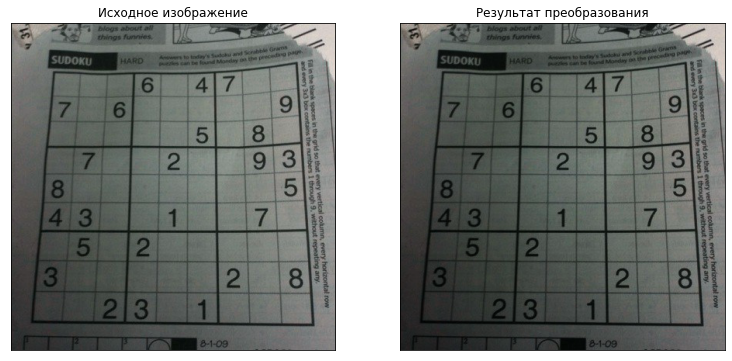

In [31]:
# Gamma correction
gamma_corrected = skimage.exposure.adjust_gamma(image, gamma=1.2)
plot_transform_result(image, gamma_corrected)

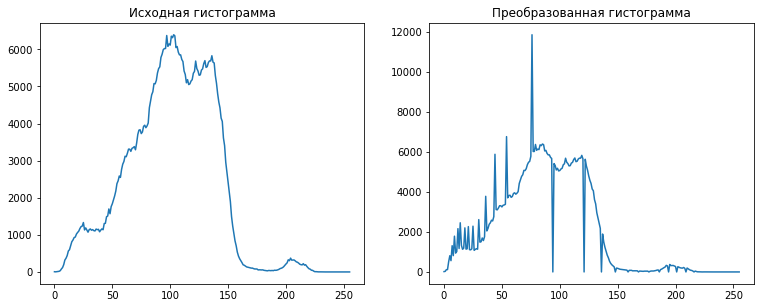

In [32]:
hist, bins = np.histogram(image.flatten(), 256, [0,256])
hist_rescale, bins = np.histogram(gamma_corrected.flatten(), 256, [0,256])

fig, m_axs = plt.subplots(1, 2, figsize=(6.4*2, 4.8*1), constrained_layout=False)
ax1, ax2 = m_axs

ax1.set_title('Исходная гистограмма')
ax1.plot(hist)
ax2.set_title('Преобразованная гистограмма')
ax2.plot(hist_rescale)
plt.show()

## Логарифмическая коррекция

Преобразование по логарифму.

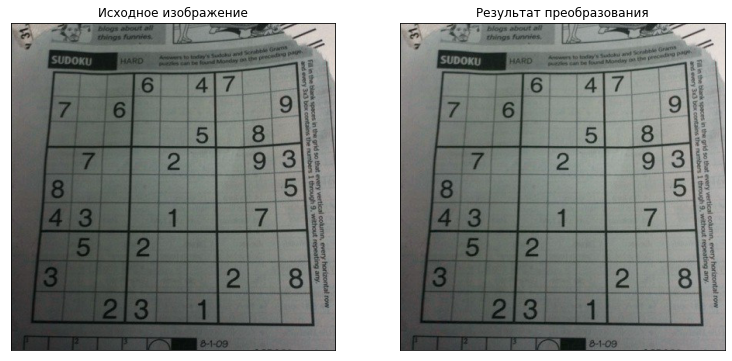

In [33]:
# Logarithmic
logarithmic_corrected = skimage.exposure.adjust_log(image, gain=1)

plot_transform_result(image, logarithmic_corrected)

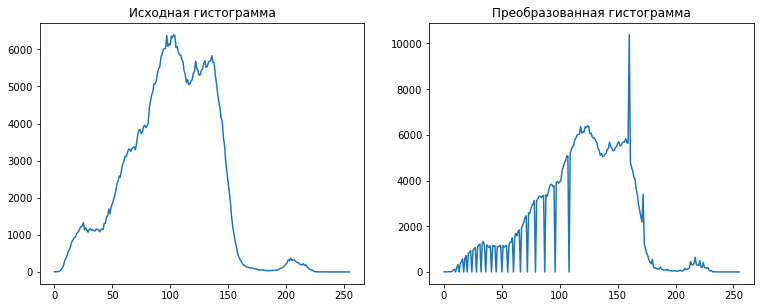

In [34]:
hist, bins = np.histogram(image.flatten(), 256, [0,256])
hist_rescale, bins = np.histogram(logarithmic_corrected.flatten(), 256, [0,256])

fig, m_axs = plt.subplots(1, 2, figsize=(6.4*2, 4.8*1), constrained_layout=False)
ax1, ax2 = m_axs

ax1.set_title('Исходная гистограмма')
ax1.plot(hist)
ax2.set_title('Преобразованная гистограмма')
ax2.plot(hist_rescale)
plt.show()

## CLAHE

Первое выравнивание гистограммы, которое мы только что видели, учитывает глобальный контраст изображения. Во многих случаях это не очень хорошая идея. Например, ниже изображение показывает входное изображение и его результат после глобальной выравнивания гистограммы.

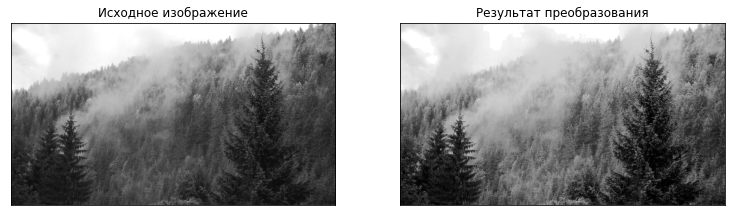

In [35]:
## вспомним, что было с линиаризацией освещенности
image = cv2.imread('img/forest.jpg')
gray = cv2.cvtColor(image.copy(), cv2.COLOR_BGR2GRAY)
clahe_image = cv2.equalizeHist(gray)

plot_transform_result(gray, clahe_image, is_gray=True)

Это правда, что контрастность фона улучшилась после выравнивания гистограммы. Мы потеряли большую часть информации там из-за чрезмерной яркости. Это потому, что его гистограмма не ограничена определенной областью, как мы видели в предыдущих случаях.

Поэтому для решения этой проблемы используется __адаптивное выравнивание гистограммы (AHE)__. При этом изображение делится на маленькие блоки, называемые «плитками» (tileSize по умолчанию в OpenCV составляет $8\times8$). Затем каждый из этих блоков гистограммы выравнивается как обычно. Таким образом, в небольшой области гистограмма будет ограничена небольшой областью (если нет шума), как показано на рисунке:

<img src="https://i.ibb.co/Z2v37jw/AHE-neighbourhoods.png" alt="Drawing" style="width: 300px;"/>

Если шум есть, он будет усилен. Чтобы избежать этого, применяется ограничение контраста. Если какой-либо интервал гистограммы превышает указанный предел контраста (по умолчанию $40$ в OpenCV), эти пиксели обрезаются и распределяются равномерно по другим интервалам перед применением выравнивания гистограммы. После выравнивания для удаления артефактов на границах мозаики применяется билинейная интерполяция.

Ниже приведен фрагмент кода, демонстрирующий применение CLAHE в OpenCV:

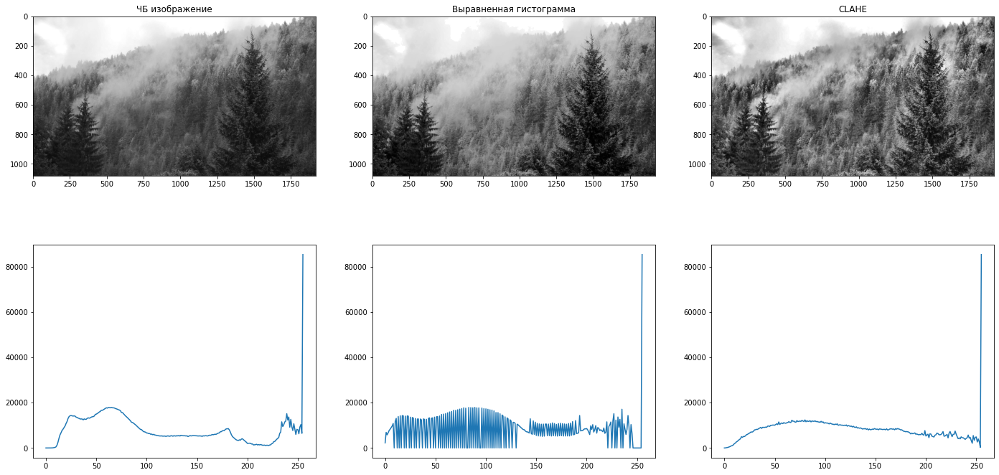

In [36]:
# применим CLAHE из cv2 и сравним результат с обычным варвниваем всей гистрограммы
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
cl1 = clahe.apply(gray)

hist_gray = cv2.calcHist([gray], [0], None, [256], [0,256])
hist_equ = cv2.calcHist([clahe_image], [0], None, [256], [0,256])
hist_clahe = cv2.calcHist([cl1], [0], None, [256], [0,256])

fig, m_axs = plt.subplots(2, 3, figsize=(24, 12))
ax1, ax2 = m_axs

ax1[0].set_title('ЧБ изображение')
ax1[0].imshow(gray, cmap='gray')
ax1[1].set_title('Выравненная гистограмма')
ax1[1].imshow(clahe_image, cmap='gray')
ax1[2].set_title('CLAHE')
ax1[2].imshow(cl1, cmap='gray')

ax2[0].plot(hist_gray)
ax2[1].plot(hist_equ)
ax2[2].plot(hist_clahe);

### Практика

Воспользуемся реализованными ранее функциями скользящего окна и реализуем собственный CLAHE для каждого канала изображения, а затем сравним нашу рализацию и ```cv2```.

In [37]:
# Ваш код

### Контрольные вопросы:

1. Как найти оптимальные параметры для **CLAHE**?

2. Как коррелируют гистограммы **CLAHE** и первичная?

3. Что будет с нормальной фоткой после **CLAHE**?

4. Как сделать __CLAHE__ к цветному изображению?

5. Что будет, если __CLAHE__ применить к другим формата кодирования цвета: HSV, LAB? Какой формат кодирования лучше подходит для работы с коррекцией цвета?

6. Что будет, если __equalization__ применить к другим формата кодирования цвета: HSV, LAB? Какой формат кодирования лучше подходит для работы с коррекцией цвета?

## Multiscale retinex

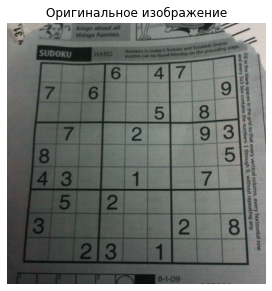

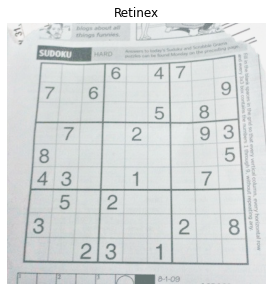

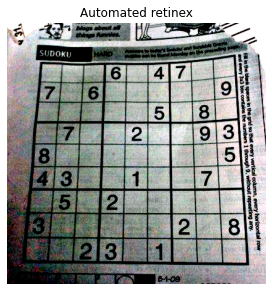

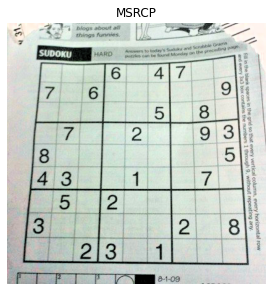

In [38]:
import retinex

with open('config.json', 'r') as f:
    config = json.load(f)

img = cv2.imread('img/sudoku.jpg')

img_msrcr = retinex.MSRCR(
    img,
    config['sigma_list'],
    config['G'],
    config['b'],
    config['alpha'],
    config['beta'],
    config['low_clip'],
    config['high_clip']
)

img_amsrcr = retinex.automatedMSRCR(
    img,
    config['sigma_list']
)

img_msrcp = retinex.MSRCP(
    img,
    config['sigma_list'],
    config['low_clip'],
    config['high_clip']        
)    

shape = img.shape
plt.figure(figsize=(6.4*1, 4.8*1), constrained_layout=False)
plt.imshow(img), plt.title('Оригинальное изображение'), plt.axis('off'), plt.show()

plt.figure(figsize=(6.4*1, 4.8*1), constrained_layout=False)
plt.imshow(img_msrcr), plt.title('Retinex'), plt.axis('off'), plt.show()

plt.figure(figsize=(6.4*1, 4.8*1), constrained_layout=False)
plt.imshow(img_amsrcr), plt.title('Automated retinex'), plt.axis('off'), plt.show()

plt.figure(figsize=(6.4*1, 4.8*1), constrained_layout=False)
plt.imshow(img_msrcp),  plt.title('MSRCP'), plt.axis('off'), plt.show();

# Бинаризация изображений
Здесь все просто. Если значение пикселя больше порогового значения, ему присваивается одно значение (может быть белым), в противном случае ему присваивается другое значение (может быть черным). Используемая функция **cv2.threshold(src, thresh, maxval, type)**

* **src** $-$ исходное изображение, которое должно быть изображением в градациях серого
* **thresh** $-$ пороговое значение, которое используется для классификации значений пикселей
* **maxval** $-$ представляет значение, которое будет дано, если значение пикселя больше (иногда меньше) порогового значения
* **type** $-$ предоставляет различные стили порогового значения.

Различные типы:
1. cv2.THRESH_BINARY
2. cv2.THRESH_BINARY_INV
3. cv2.THRESH_TRUNC
4. cv2.THRESH_TOZERO
5. cv2.THRESH_TOZERO_INV

На выходе функция возвращает два значения. Первый $-$ **retval**, которое будет объяснено позже. Второй $-$ **thresholded image**.

Подробнее в [документации](https://docs.opencv.org/3.4.2/d7/d1b/group__imgproc__misc.html#gae8a4a146d1ca78c626a53577199e9c57).

Рассмотрим разные типы threshold на примере градиента серого цвета.

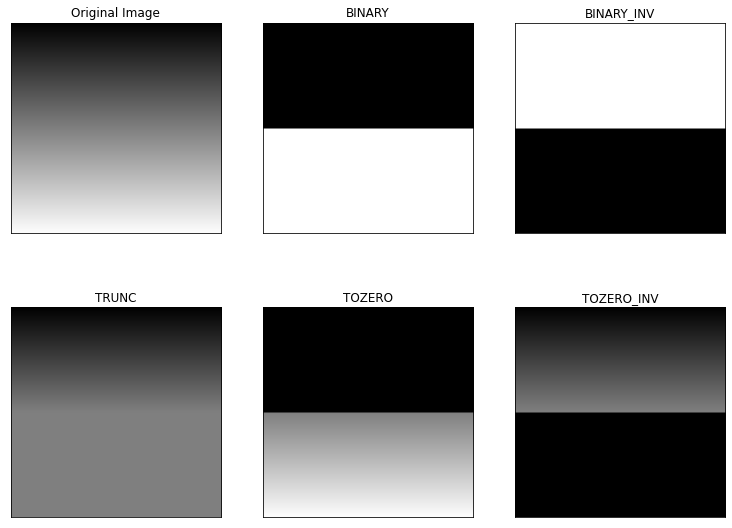

In [39]:
img = cv2.imread('img/grad_grayscale.png')

ret, thresh1 = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)
ret, thresh2 = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY_INV)
ret, thresh3 = cv2.threshold(img, 127, 255, cv2.THRESH_TRUNC)
ret, thresh4 = cv2.threshold(img, 127, 255, cv2.THRESH_TOZERO)
ret, thresh5 = cv2.threshold(img, 127, 255, cv2.THRESH_TOZERO_INV)

titles = ['Original Image','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]
plt.figure(figsize=(6.4*2, 4.8*2), constrained_layout=False)
for i in range(6):
    plt.subplot(2, 3, i + 1)
    plt.imshow(images[i],'gray')
    plt.title(titles[i]), plt.xticks([]), plt.yticks([])
plt.show()

## Adaptive Thresholding
В предыдущем разделе мы использовали глобальное значение в качестве порогового значения. Но это может быть не хорошо во всех условиях, когда изображение имеет разные условия освещения в разных областях. В этом случае мы идем на адаптивный порог. При этом алгоритм вычисляет порог для небольших областей изображения. Таким образом, мы получаем разные пороговые значения для разных областей одного и того же изображения, и это дает нам лучшие результаты для изображений с разной освещенностью.

Он имеет три «специальных» входных параметра и только один выходной аргумент.

Адаптивный метод $-$ **cv2.adaptiveThreshold(src, maxValue, adaptiveMethod, thresholdType, blockSize, C)** - решает, как рассчитывается пороговое значение.

* **thresholdType**:
    * *cv2.ADAPTIVE_THRESH_MEAN_C*: пороговое значение является средним значением области соседства.

    * *cv2.ADAPTIVE_THRESH_GAUSSIAN_C*: пороговое значение представляет собой взвешенную сумму значений окрестностей, где веса представляют собой гауссово окно.

* **blockSize** $-$ определяет размер окна.

* **C** $-$ это константа, которая вычитается из вычисленного среднего или взвешенного среднего.

Ниже приведен фрагмент кода, сравнивающий глобальные пороги и адаптивные пороги для изображения с различным освещением:

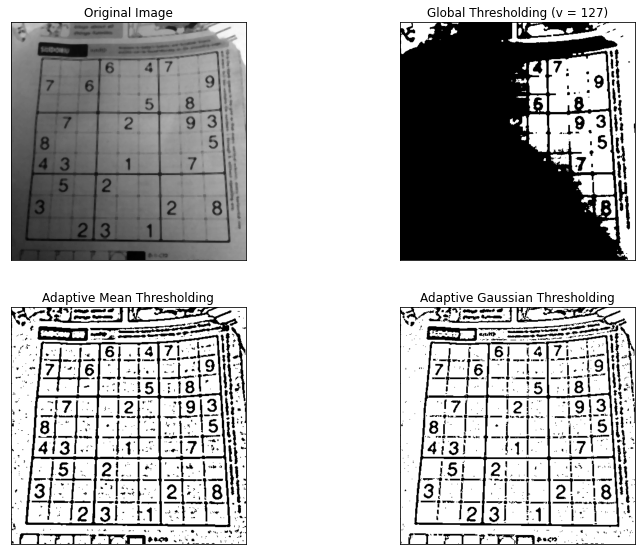

In [40]:
img = cv2.imread('img/sudoku.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
img = cv2.medianBlur(img, 5)


ret, th1 = cv2.threshold(img, 127, 255,cv2.THRESH_BINARY)
th2 = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)
th3 = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)


titles = ['Original Image', 'Global Thresholding (v = 127)',
            'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']
images = [img, th1, th2, th3]
plt.figure(figsize=(6.4*2, 4.8*2), constrained_layout=False)
for i in range(4):
    plt.subplot(2, 2, i + 1)
    plt.imshow(images[i],'gray')
    plt.title(titles[i]), plt.xticks([]), plt.yticks([])
plt.show()

## Бинаризация Оцу
В первом разделе я говорил вам, что есть второй параметр retVal. Его использование происходит, когда мы идем на бинаризацию Оцу. Так что же это?

В глобальном пороговом значении мы использовали произвольное значение для порогового значения, верно? Итак, как мы можем знать, что выбранное нами значение является хорошим или нет? Ответ, метод проб и ошибок. Но рассмотрим бимодальное изображение (проще говоря, бимодальное изображение - это изображение, гистограмма которого имеет два пика). Для этого изображения мы можем приблизительно принять значение в середине этих пиков в качестве порогового значения, верно? Это то, что делает бинаризация Оцу. Таким образом, простыми словами, он автоматически вычисляет пороговое значение из гистограммы изображения для бимодального изображения. (Для изображений, которые не являются бимодальными, бинаризация не будет точной.)

Для этого используется наша функция **cv2.threshold()**, но передается дополнительный флаг *cv2.THRESH_OTSU*. Для порогового значения просто введите ноль. Затем алгоритм находит оптимальное пороговое значение и возвращает вас в качестве второго выхода retVal. Если пороговое значение Otsu не используется, **retVal** соответствует пороговому значению, которое вы использовали.

Проверьте ниже пример. Входное изображение является шумным изображением. В первом случае я применил глобальный порог для значения $127$. Во втором случае я применил порог Оцу напрямую. В третьем случае я отфильтровал изображение с гауссовым ядром $5\times5$, чтобы удалить шум, затем применил пороговое значение Оцу. Посмотрите, как фильтрация шума улучшает результат.

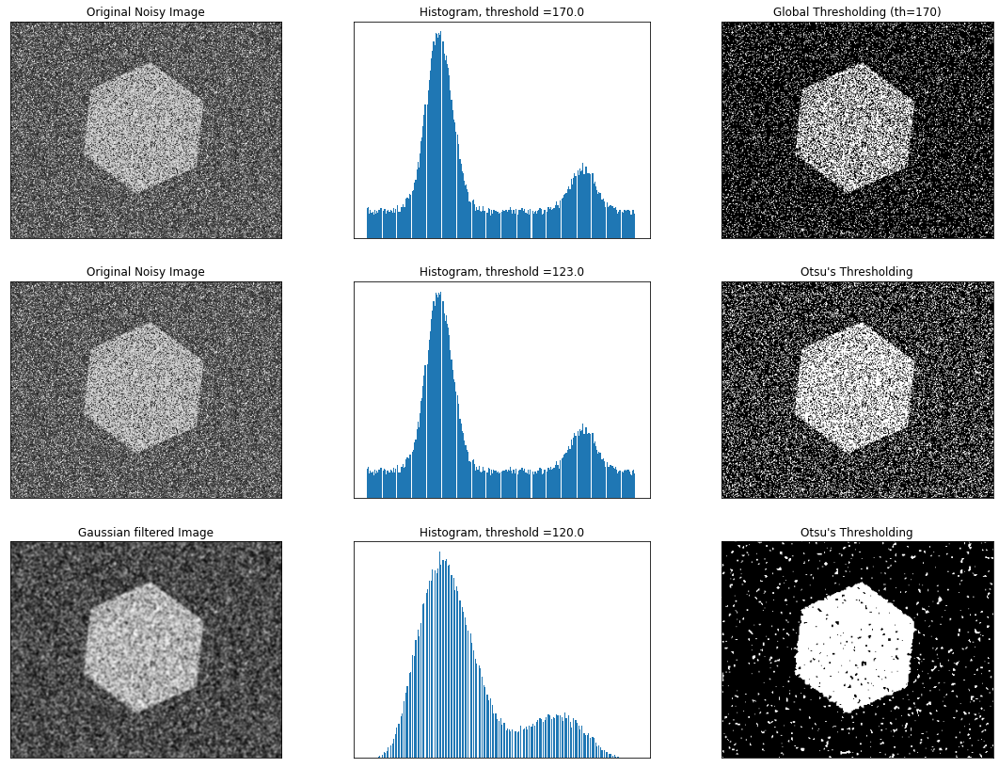

In [41]:
img = cv2.imread('img/otsu_ex.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# внесем случайный шум
noise_img = img.copy()
mask = np.random.randint(0, 2, size=noise_img.shape).astype(np.bool)
r = np.random.rand(*noise_img.shape) * np.max(noise_img)
noise_img[mask] = r[mask]
img = noise_img

# global thresholding
ret1, th1 = cv2.threshold(img, 170, 255, cv2.THRESH_BINARY)
# Otsu's thresholding
ret2, th2 = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
# Otsu's thresholding after Gaussian filtering
blur = cv2.GaussianBlur(img, (5,5), 0)
ret3, th3 = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)


# plot all the images and their histograms
images = [img, 0, th1,
          img, 0, th2,
          blur, 0, th3]
ret = [ret1, ret2, ret3]
titles = ['Original Noisy Image','Histogram','Global Thresholding (th=170)',
          'Original Noisy Image','Histogram',"Otsu's Thresholding",
          'Gaussian filtered Image','Histogram',"Otsu's Thresholding"]
plt.figure(figsize=(6.4*3, 4.8*3), constrained_layout=False)
for i in range(3):
    plt.subplot(3, 3, i * 3 + 1), plt.imshow(images[i*3],'gray')
    plt.title(titles[i * 3]), plt.xticks([]), plt.yticks([])
    
    plt.subplot(3, 3, i * 3 + 2), plt.hist(images[i*3].ravel(), 256)
    plt.title(titles[i * 3 + 1] + ', threshold =' + str(ret[i])), plt.xticks([]), plt.yticks([])
    
    plt.subplot(3, 3, i * 3 + 3), plt.imshow(images[i*3 + 2],'gray')
    plt.title(titles[i * 3 + 2]), plt.xticks([]), plt.yticks([])
plt.show()

## Пример с цветокоррекцией



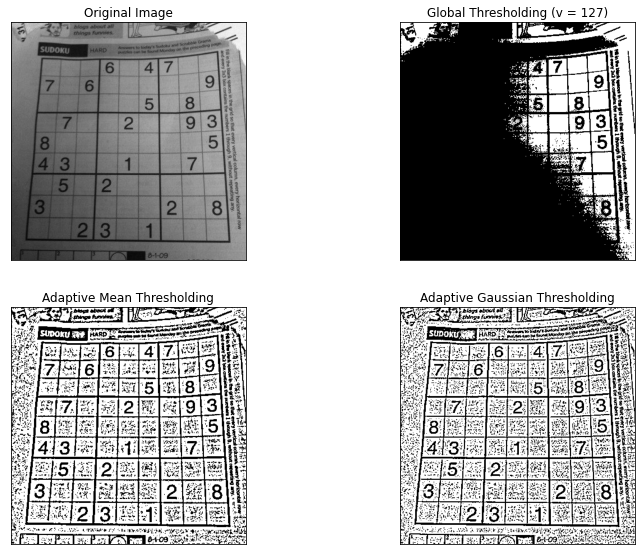

In [42]:
img = cv2.imread('img/sudoku.jpg')

img_msrcp = retinex.MSRCP(
    img,
    config['sigma_list'],
    config['low_clip'],
    config['high_clip']        
)   

img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

ret, th1 = cv2.threshold(img, 127, 255,cv2.THRESH_BINARY)
th2 = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)
th3 = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

titles = ['Original Image', 'Global Thresholding (v = 127)',
            'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding']
images = [img, th1, th2, th3]
plt.figure(figsize=(6.4*2, 4.8*2), constrained_layout=False)
for i in range(4):
    plt.subplot(2, 2, i + 1)
    plt.imshow(images[i],'gray')
    plt.title(titles[i]), plt.xticks([]), plt.yticks([])
plt.show()

# Морфологические трансформации
Морфологические преобразования $-$ это простые операции, основанные на форме изображения. Обычно это выполняется на двоичных изображениях. Он требует двух входных данных, один из которых является нашим исходным изображением, второй называется структурирующим элементом или ядром, которое определяет характер операции. Два основных морфологических оператора - это **эрозия** и **растягивание**. Затем его разновидности, такие как открытие, закрытие, градиент и т. д.

**Эрозия** (размывание/сужение) изображения обычно используется для избавления от случайных вкраплений на изображении. Идея состоит в том, что вкрапления при размывании устранятся, тогда как крупные и соответсвенно более визуально-значимые регионы остаются.

**Растягивание** (расширение) же, по идее, так же должно устранять шум и способствовать объединению областей изображения, которые были разделены шумом, тенями.
Применение же небольшого растягивания должно сплавить эти области в одну.

Морфологические операции, чаще всего, применяются над двоичными изображениями, которые получаются после порогового преобразования (thresholding).
***
**Подробнее с математической морфологией можно ознакомиться по этим ссылка: [1](https://ru.wikipedia.org/wiki/%CC%E0%F2%E5%EC%E0%F2%E8%F7%E5%F1%EA%E0%FF_%EC%EE%F0%F4%EE%EB%EE%E3%E8%FF), [2](https://habr.com/post/113626/), [3](http://wiki.technicalvision.ru/index.php/%D0%9C%D0%BE%D1%80%D1%84%D0%BE%D0%BB%D0%BE%D0%B3%D0%B8%D1%87%D0%B5%D1%81%D0%BA%D0%B8%D0%B5_%D0%BE%D0%BF%D0%B5%D1%80%D0%B0%D1%86%D0%B8%D0%B8_%D0%BD%D0%B0_%D0%B1%D0%B8%D0%BD%D0%B0%D1%80%D0%BD%D1%8B%D1%85_%D0%B8%D0%B7%D0%BE%D0%B1%D1%80%D0%B0%D0%B6%D0%B5%D0%BD%D0%B8%D1%8F%D1%85).**

## Эрозия
Основная идея эрозии похожа только на эрозию почвы, она размывает границы объекта переднего плана (всегда старайтесь, чтобы передний план оставался белым). Так, что это делает? Ядро скользит по изображению (как в **2D**-свертке). Пиксель в исходном изображении ($1$ или $0$) будет считаться $1$, только если все пиксели под ядром равны $1$, в противном случае он размыт (обнуляется).

Итак, что происходит, так это то, что все пиксели вблизи границы будут отбрасываться в зависимости от размера ядра. Таким образом, толщина или размер объекта переднего плана уменьшается или просто белая область уменьшается на изображении. Это полезно для удаления небольших белых шумов (как мы видели в главе о цветовом пространстве), отсоединения двух связанных объектов и т. д.

Здесь, в качестве примера, я бы использовал полное ядро $5\times5$. Давайте посмотрим, как это работает:

Размер изображения: (150, 112, 3)


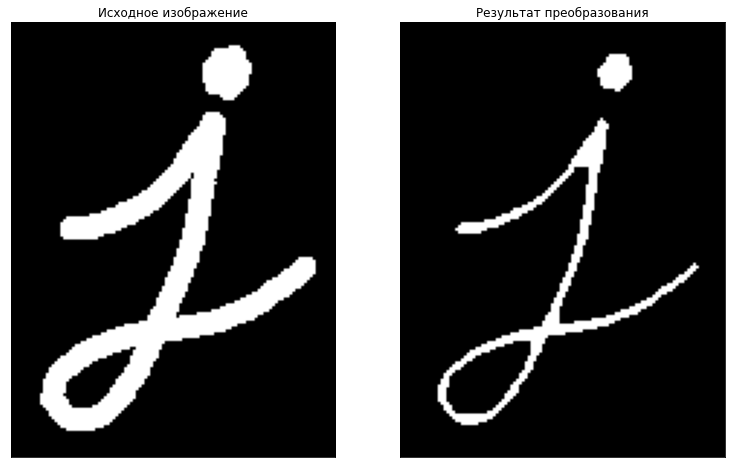

In [43]:
image = cv2.imread('img/j.png')

print(f'Размер изображения: {image.shape}')

kernel = np.ones((5, 5), np.uint8)
erosion = cv2.erode(image, kernel, iterations=1)

plot_transform_result(image, erosion)

## Растягивание
Это просто противоположность эрозии. Здесь пиксельный элемент равен «$1$», если хотя бы один пиксель под ядром равен «$1$». Таким образом, увеличивается белая область в изображении или увеличивается размер объекта переднего плана. Обычно в таких случаях, как удаление шума, за эрозией следует расширение. Потому что эрозия удаляет белые шумы, но также уменьшает наш объект. Таким образом, мы расширяем это. Поскольку шум исчез, они не вернутся, но наша площадь объекта увеличивается. Это также полезно при соединении сломанных частей объекта.

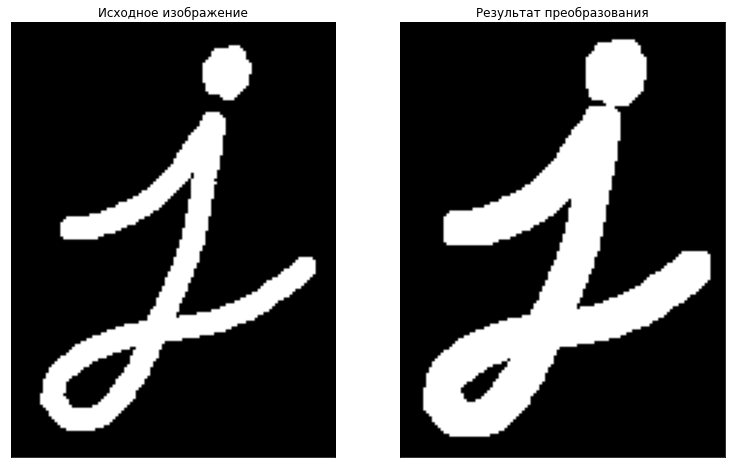

In [44]:
dilation = cv2.dilate(image, kernel, iterations=1)

plot_transform_result(image, dilation)

## Открытие
Открытие - это просто еще одно название эрозии, за которой следует расширение. Это полезно для удаления шума, как мы объяснили выше. Здесь мы используем функцию **cv2.morphologyEx()**.

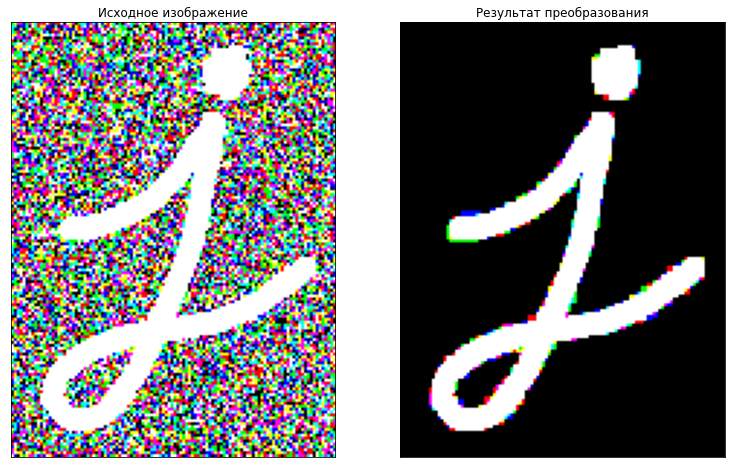

In [45]:
## внесем шум
noise_img = image.copy()
mask = np.random.randint(0, 2, size=noise_img.shape).astype(np.bool)
r = np.ones(noise_img.shape) * 255
noise_img[mask] = r[mask]

opening = cv2.morphologyEx(noise_img, cv2.MORPH_OPEN, kernel)

plot_transform_result(noise_img, opening)

## Закрытие
Закрытие является обратным открытию, растягивание с последующей эрозией. Это полезно при закрытии небольших отверстий внутри объектов переднего плана или маленьких черных точек на объекте.

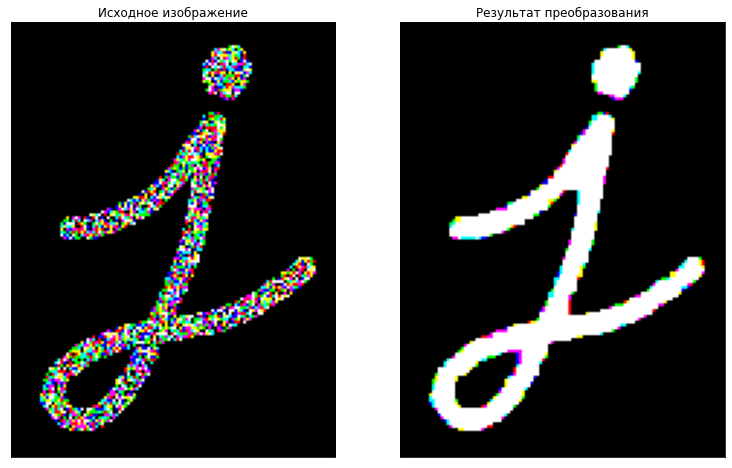

In [46]:
## внесем шум
noise_img = image.copy()
mask = np.random.randint(0, 2, size=noise_img.shape).astype(np.bool)
r = np.zeros(noise_img.shape)
noise_img[mask] = r[mask]

closing = cv2.morphologyEx(noise_img, cv2.MORPH_CLOSE, kernel)

plot_transform_result(noise_img, closing)

## Морфологический градиент
Это разница между расширением и размыванием изображения.

Результат будет выглядеть как контур объекта.

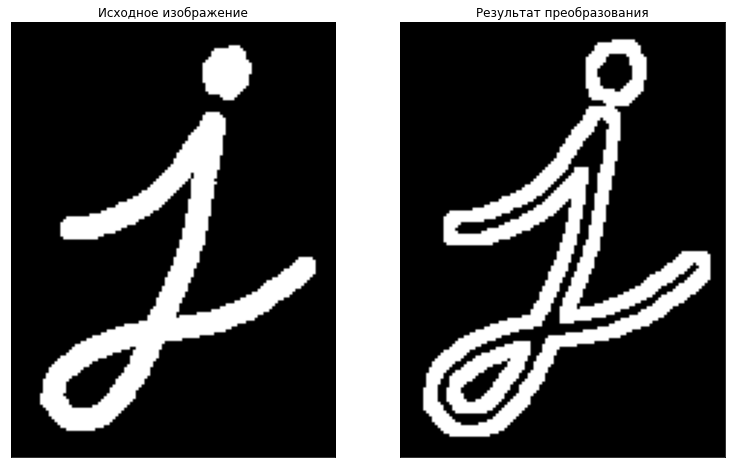

In [47]:
gradient = cv2.morphologyEx(image, cv2.MORPH_GRADIENT, kernel)

plot_transform_result(image, gradient)

## Пример

Рассмотрим предыдущий пример с бинаризацией изображения методом Оцу. Получили что-то такое.

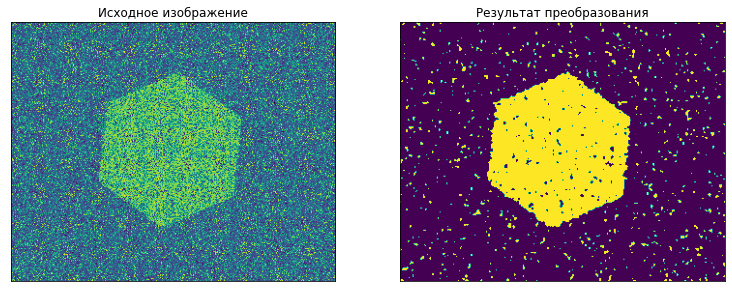

In [48]:
image = cv2.imread('img/otsu_ex.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# внесем случайный шум
noise_img = image.copy()
mask = np.random.randint(0, 2, size=noise_img.shape).astype(np.bool)
r = np.random.rand(*noise_img.shape) * np.max(noise_img)
noise_img[mask] = r[mask]
image = noise_img

blur = cv2.GaussianBlur(image, (5,5), 0)
ret3, th3 = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

plot_transform_result(image, th3)

Видим, что остались шумовые точки. Попробуем избавиться от них и получить целостную маску без артефактов с помощью морфологических операций.

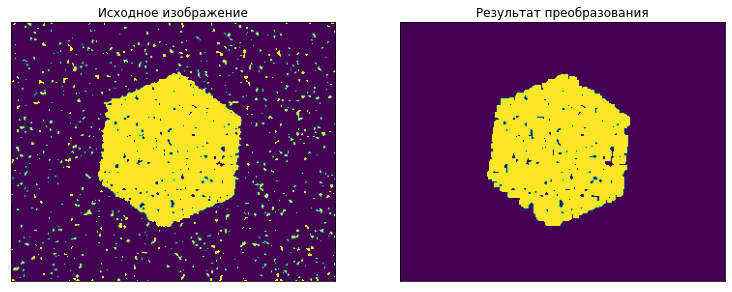

In [49]:
opening = cv2.morphologyEx(th3, cv2.MORPH_OPEN, kernel)

plot_transform_result(th3, opening)

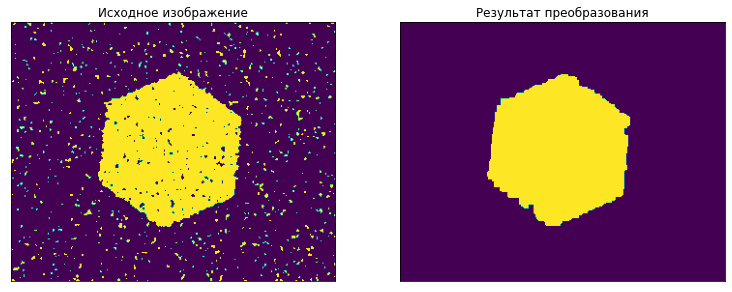

In [50]:
closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel)

plot_transform_result(th3, closing)

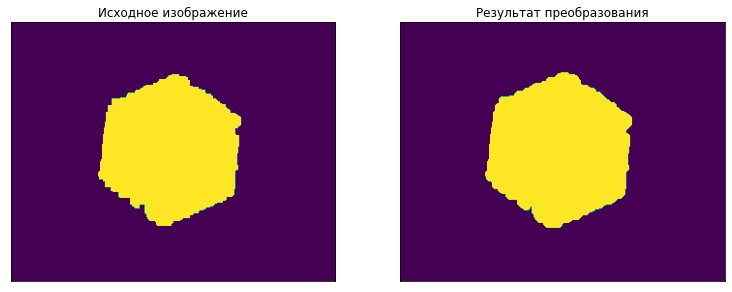

In [51]:
kernel = np.array([
    [0, 0, 1, 0, 0],
    [0, 1, 1, 1, 0],
    [1, 1, 1, 1, 1],
    [0, 1, 1, 1, 0],
    [0, 0, 1, 0, 0],
], np.uint8)
dilation = cv2.dilate(closing, kernel, iterations=1)

plot_transform_result(closing, dilation)

# Пирамиды изображений

Обычно мы работали с изображением постоянного размера. Но в некоторых случаях нам нужно работать с изображениями разного разрешения одного и того же изображения. Например, при поиске чего-либо на изображении, например лица, мы не уверены, в каком размере будет присутствовать объект на изображении. В этом случае нам нужно будет создать набор изображений с разным разрешением и выполнить поиск объекта по всем изображениям. Эти наборы изображений с разным разрешением называются пирамидами изображений (потому что, когда они хранятся в стопке с самым большим изображением внизу и самым маленьким изображением сверху, они выглядят как пирамида).

Существует два вида пирамид изображений:
1. Пирамида Гаусса
2. Пирамиды Лапласа

Более высокий уровень (низкое разрешение) в гауссовой пирамиде формируется путем удаления последовательных строк и столбцов в изображении нижнего уровня (более высокое разрешение). Затем каждый пиксель на более высоком уровне формируется вкладом из 5 пикселей на базовом уровне с гауссовыми весами. Таким образом, изображение $M \times N$ становится изображением $M / 2 \times N / 2$. То есть, площадь уменьшается до четверти первоначальной площади. Это называется Октава. Та же самая картина продолжается, когда мы идем вверх в пирамиде (то есть разрешение уменьшается). Аналогично, при расширении область становится 4 раза на каждом уровне. Мы можем найти гауссовы пирамиды, используя функции ```cv2.pyrDown()``` и ```cv2.pyrUp()```.

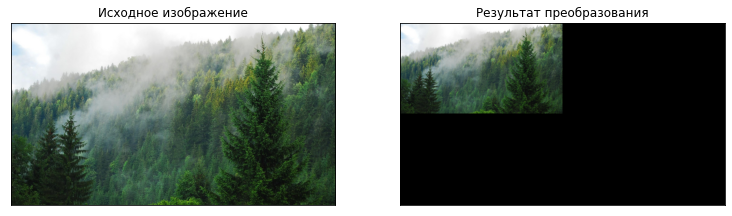

In [52]:
image = cv2.imread('img/forest.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

h, w, _ = image.shape
# создадим пустую подложку
zero_back = np.zeros((h, w, 3), np.uint8)

# сделаем элемент пирамиды (уменьшим)
lower_reso = cv2.pyrDown(image)
h, w, _ = lower_reso.shape
zero_back[:h, :w, :] = lower_reso  # разместим преобразованное изображение на подложку

# отобразим результат
plot_transform_result(image, zero_back)

Теперь вы можете перейти вниз по пирамиде изображения с помощью функции ```cv2.pyrUp()```.

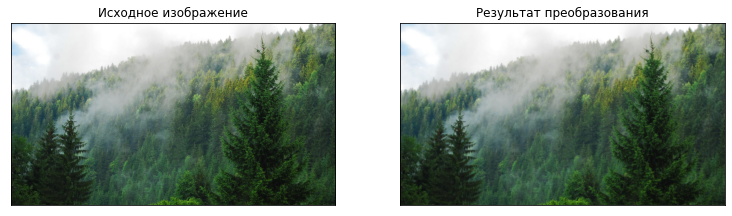

In [53]:
# сделаем элемент пирамиды (увеличим) уже уменьшенное
higher_reso = cv2.pyrUp(lower_reso)

# отобразим результат
plot_transform_result(image, higher_reso)

Лапласовские пирамиды образованы из гауссовых пирамид. Для этого нет специальной функции. Изображения пирамиды Лапласа подобны только краевым изображениям. Большинство его элементов - нули. Они используются в сжатии изображений. Уровень в лапласовой пирамиде формируется разницей между этим текущим в гауссовой пирамиде и ее расширенной версией верхнего уровня в гауссовой пирамиде.

In [54]:
# Генерируем пирамиды Гаусса
G = image.copy()
gpA = [G]
for i in range(6):
    G = cv2.pyrDown(G)
    gpA.append(G)
    
# Генерируем пирамиды Лапласа
lpA = [gpA[5]]
for i in range(5,0,-1):
    GE = cv2.pyrUp(gpA[i])
    h_ge, w_ge, _ = GE.shape
    h_a, w_a, _ = gpA[i-1].shape
    print(f'Разница между высотой и шириной:', abs(h_ge-h_a), abs(w_ge-w_a))
    
    # делаем падинг для согласования размеров изображений
    gpA[i-1] = np.pad(gpA[i-1], pad_width=[(0, abs(h_ge-h_a)), (0, abs(w_ge-w_a)), (0, 0)], mode='edge')
    print(f'Размеры изображений после падинга: {GE.shape, gpA[i-1].shape}\n')
    
    L = cv2.subtract(gpA[i-1], GE)
    lpA.append(L)

Разница между высотой и шириной: 0 0
Размеры изображений после падинга: ((68, 120, 3), (68, 120, 3))

Разница между высотой и шириной: 1 0
Размеры изображений после падинга: ((136, 240, 3), (136, 240, 3))

Разница между высотой и шириной: 2 0
Размеры изображений после падинга: ((272, 480, 3), (272, 480, 3))

Разница между высотой и шириной: 4 0
Размеры изображений после падинга: ((544, 960, 3), (544, 960, 3))

Разница между высотой и шириной: 8 0
Размеры изображений после падинга: ((1088, 1920, 3), (1088, 1920, 3))



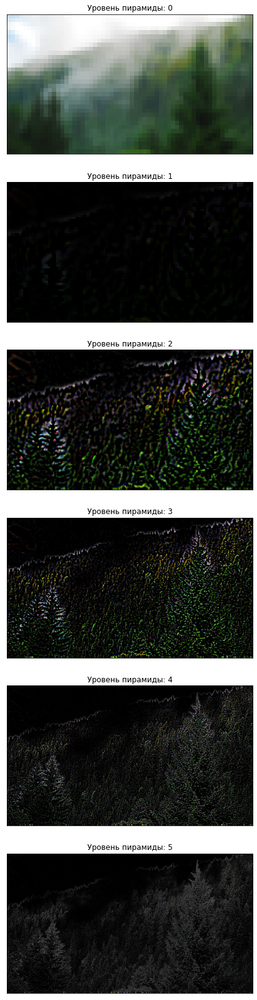

In [55]:
# Визуализация пирамид
fig, m_axs = plt.subplots(6, 1, figsize=(6.4*6, 4.8*6), constrained_layout=False)
m_axs = m_axs.ravel(order='C')

for i in range(len(lpA)):
    tmp = lpA[i].copy()
    if i > 1:
        tmp *= 10  # повысим контраст, чтобы было видно
    m_axs[i].imshow(tmp)
    m_axs[i].set_title(f'Уровень пирамиды: {i}')
    m_axs[i].set_xticks([]), m_axs[i].set_yticks([])
    
plt.show()

## Blending

Одним из применений пирамид является **смешивание изображений (blending)**. Например, при сшивании изображений вам нужно будет сложить два изображения вместе, но это может выглядеть не очень хорошо из-за разрыва между изображениями. В этом случае смешивание изображений с пирамидами обеспечивает плавное смешивание, не оставляя большого количества данных на изображениях. Одним из классических примеров этого является смешивание двух фруктов, апельсина и яблока. Теперь посмотрите на результат, чтобы понять, что я говорю:

<img src="img/orapple.jpg" alt="Drawing" style="width: 350px;"/>

Пожалуйста, проверьте первую ссылку в дополнительных ресурсах, она имеет полную схематическую информацию о смешивании изображений, лапласовых пирамид и т. Д. Просто это делается следующим образом:

* Загрузите два изображения яблока и апельсина
* Найдите гауссовы пирамиды для яблок и апельсинов (в данном конкретном примере количество уровней равно 6)
* Из гауссовых пирамид, найдите их лапласианские пирамиды
* Теперь соедините левую половину яблока и правую половину апельсина на каждом уровне лапласианских пирамид
* Наконец из этого совместного изображения пирамид, восстановить исходное изображение

## Практика

Смешать два изображения (blending) с помощью пирамид. Примеры изображений загружены ниже.

Размер 1 изображения: (433, 577, 3) 
Размер 2 изображения: (433, 577, 3)


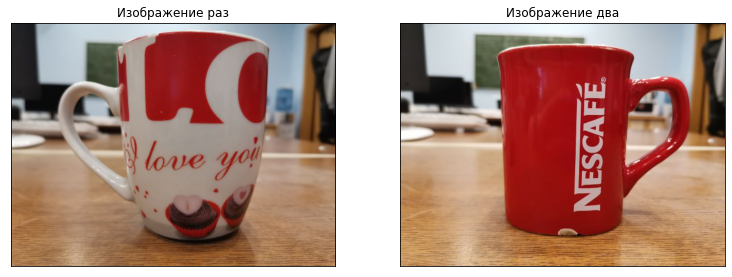

In [56]:
img_left = cv2.imread('img/cap_1.jpg')
img_left = cv2.cvtColor(img_left, cv2.COLOR_BGR2RGB)
img_right = cv2.imread('img/cap_2.jpg')
img_right = cv2.cvtColor(img_right, cv2.COLOR_BGR2RGB)

print(f'Размер 1 изображения: {img_left.shape} \nРазмер 2 изображения: {img_right.shape}')

fig, m_axs = plt.subplots(1, 2, figsize=(6.4*2, 4.8*2), constrained_layout=False)
ax1, ax2 = m_axs

ax1.set_title('Изображение раз')
ax1.imshow(img_left)
ax1.set_xticks([]), ax1.set_yticks([])
ax2.set_title('Изображение два')
ax2.imshow(img_right)
ax2.set_xticks([]), ax2.set_yticks([])
plt.show()

In [57]:
def create_gp_lp(image, rg=6):
    
    # Генерируем пирамиды Гаусса
    G = image.copy()
    gpA = [G]
    for i in range(rg):
        G = cv2.pyrDown(G)
        gpA.append(G)

    # Генерируем пирамиды Лапласа
    lpA = [gpA[rg - 1]]
    for i in range(rg - 1, 0, -1):
        GE = cv2.pyrUp(gpA[i])
        h_ge, w_ge, _ = GE.shape
        h_a, w_a, _ = gpA[i-1].shape

        # делаем падинг для согласования размеров изображений
        gpA[i-1] = np.pad(gpA[i-1], pad_width=[(0, abs(h_ge-h_a)), (0, abs(w_ge-w_a)), (0, 0)], mode='edge')

        L = cv2.subtract(gpA[i-1], GE)
        lpA.append(L)
        
    return gpA, lpA

In [58]:
rg = 5
gpA, lpA = create_gp_lp(img_left, rg)

In [59]:
gpB, lpB = create_gp_lp(img_right, rg)

In [60]:
LS = []
for la, lb in zip(lpA, lpB):
    rows, cols, dpt = la.shape
    ls = np.hstack((la[:, 0:cols//2], lb[:, cols//2:]))
    LS.append(ls)

In [61]:
[LS[i].shape for i in range(len(LS))]

[(28, 37, 3), (56, 74, 3), (112, 148, 3), (224, 296, 3), (448, 592, 3)]

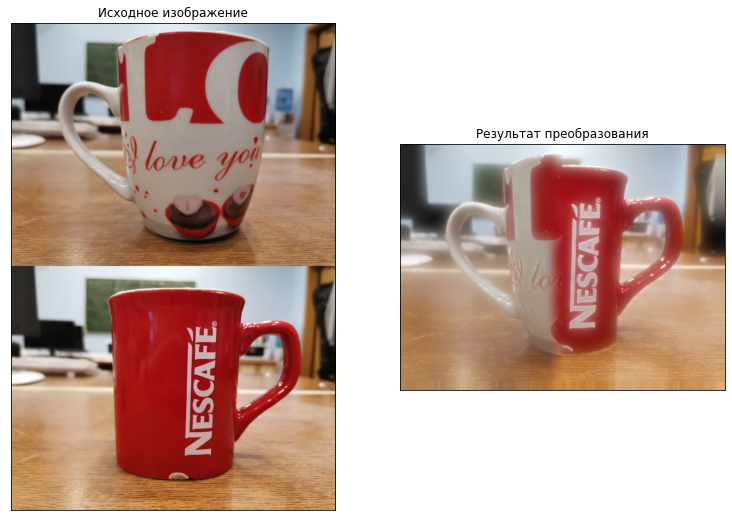

In [62]:
# соединияем уровни
ls_ = LS[0]
for i in range(1, rg):
    ls_ = cv2.pyrUp(ls_)
    ls_ = cv2.add(ls_, LS[i])

# соеденим части изображений
real = np.hstack((ls_[:, :cols//2], ls_[:, cols//2:]))
combined_image = np.vstack((img_left, img_right))

plot_transform_result(combined_image, real)